## Lecture-03 Gradient Descent and Dymanic Programming

In this week, we need complete following tasks:
+ Re-review the course online programming; 
+ Choose 1 - 2 books which you interested and keep reading; 
+ Answer the review questions
+ Prepare the basic requirement of our 1st project. 

### Part I Review the online programming. 

In [128]:
from collections import defaultdict
original_price = [1, 5, 8, 9, 10, 17, 17, 20, 24, 30]
price = defaultdict(int)
solution={}
for i,p in enumerate(original_price):
    price[i+1] = p

def call_times(fun):
    call_times.calltimes = defaultdict(int)
    def arg(a):
        result = fun(a)
        call_times.calltimes[a]+=1
        return result
    return arg
        
        
    
    
def memo(f):
    memo.conputed = {}
    def arg(a):
        if a in memo.conputed:
            return memo.conputed[a]
        else:
            memo.conputed[a] = f(a)
            return memo.conputed[a]
    return arg

@call_times
@memo        
def r(n):
    max_price,max_split =  max(
        [(price[n],0)]+[(r(i)+r(n-i),i) for i in range(1,n)],key = lambda x :x[0]
    )
    solution[n]=[max_split,n-max_split]
    print(solution)
    return max_price

print(r(30))
print(call_times.calltimes)
print(memo.conputed)

def solution_detail(n):
    detail=[]
    left_s,right_s = solution[n]
    if left_s==0:
        detail.append(right_s)
    else:
        detail.append(solution_detail(left_s)+solution_detail(right_s))
    return detail
print (solution_detail(11))


{1: [0, 1]}
{1: [0, 1], 2: [0, 2]}
{1: [0, 1], 2: [0, 2], 3: [0, 3]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6], 9: [3, 6]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6], 9: [3, 6], 10: [0, 10]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6], 9: [3, 6], 10: [0, 10], 11: [1, 10]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6], 9: [3, 6], 10: [0, 10], 11: [1, 10], 12: [2, 10]}
{1: [0, 1], 2: [0, 2], 3: [0, 3], 4: [2, 2], 5: [2, 3], 6: [0, 6], 7: [1, 6], 8: [2, 6], 9: [3, 6], 10: [0, 10], 11: [

### Part 2: change loss function from $loss = \frac{1}{n}\sum{(y_i - \hat(y_i))^2}$ to $loss = \frac{1}{n}\sum{|y_i - \hat{y_i}|}$, and using your mathmatical knowledge to get the right partial formual. Implemen the gradient descent code.

In [90]:
from sklearn.datasets import load_boston
data = load_boston()
x_source,y = data['data'],data['target']
print(x_source[1])
x = x_source[:,5]

print(x)
    

[2.7310e-02 0.0000e+00 7.0700e+00 0.0000e+00 4.6900e-01 6.4210e+00
 7.8900e+01 4.9671e+00 2.0000e+00 2.4200e+02 1.7800e+01 3.9690e+02
 9.1400e+00]
[6.575 6.421 7.185 6.998 7.147 6.43  6.012 6.172 5.631 6.004 6.377 6.009
 5.889 5.949 6.096 5.834 5.935 5.99  5.456 5.727 5.57  5.965 6.142 5.813
 5.924 5.599 5.813 6.047 6.495 6.674 5.713 6.072 5.95  5.701 6.096 5.933
 5.841 5.85  5.966 6.595 7.024 6.77  6.169 6.211 6.069 5.682 5.786 6.03
 5.399 5.602 5.963 6.115 6.511 5.998 5.888 7.249 6.383 6.816 6.145 5.927
 5.741 5.966 6.456 6.762 7.104 6.29  5.787 5.878 5.594 5.885 6.417 5.961
 6.065 6.245 6.273 6.286 6.279 6.14  6.232 5.874 6.727 6.619 6.302 6.167
 6.389 6.63  6.015 6.121 7.007 7.079 6.417 6.405 6.442 6.211 6.249 6.625
 6.163 8.069 7.82  7.416 6.727 6.781 6.405 6.137 6.167 5.851 5.836 6.127
 6.474 6.229 6.195 6.715 5.913 6.092 6.254 5.928 6.176 6.021 5.872 5.731
 5.87  6.004 5.961 5.856 5.879 5.986 5.613 5.693 6.431 5.637 6.458 6.326
 6.372 5.822 5.757 6.335 5.942 6.454 5.857 6.151 6.

In [91]:
def price(k,x,b):
    return k*x+b
def loss(y,y_hat):
    sum=0.0
    for y_i,y_hat_i in zip(y,y_hat):
        print('y_i is {},y_hat_i is {}'.format(y_i,y_hat_i))
        if y_i>y_hat_i:
            sum += y_i-y_hat_i
        else:
            sum += y_hat_i-y_i
    sum = sum/len(y)
    return sum

In [92]:
def partial_k(x,y,y_hat):
    sum_k = 0.0
    for x_i,y_i,y_hat_i in zip(x,y,y_hat):
        if y_i>y_hat_i:
            sum_k += -1*x_i
        else:
            sum_k += x_i
    return sum_k/len(y)
def partial_b(y,y_hat):
    sum_b = 0.0
    for y_i,y_hat_i in zip(y,y_hat):
        if y_i>y_hat_i:
            sum_b +=-1
        else:
            sum_b +=1
    return sum_b/len(y)   
            

y_i is 24.0,y_hat_i is -655.3015956367178
y_i is 21.6,y_hat_i is -641.3770829167132
y_i is 34.7,y_hat_i is -710.4571330341383
y_i is 33.4,y_hat_i is -693.5487961598471
y_i is 36.2,y_hat_i is -707.0212143110205
y_i is 28.7,y_hat_i is -642.1908531406095
y_i is 22.9,y_hat_i is -604.3957471863115
y_i is 27.1,y_hat_i is -618.8627733889136
y_i is 16.5,y_hat_i is -569.9461410413652
y_i is 18.9,y_hat_i is -603.6723958761813
y_i is 15.0,y_hat_i is -637.3986507109976
y_i is 18.9,y_hat_i is -604.1244904450127
y_i is 21.7,y_hat_i is -593.2742207930611
y_i is 20.4,y_hat_i is -598.6993556190369
y_i is 18.2,y_hat_i is -611.9909359426777
y_i is 19.9,y_hat_i is -588.3011805359166
y_i is 23.1,y_hat_i is -597.4334908263091
y_i is 17.5,y_hat_i is -602.4065310834537
y_i is 20.2,y_hat_i is -554.1228311322691
y_i is 18.2,y_hat_i is -578.6263567629264
y_i is 13.6,y_hat_i is -564.4305873016231
y_i is 19.6,y_hat_i is -600.1460582392971
y_i is 15.2,y_hat_i is -616.1502059759257
y_i is 14.5,y_hat_i is -586.402383

y_i is 7.0,y_hat_i is -457.6402038147032
y_i is 7.2,y_hat_i is -625.978393736386
y_i is 7.5,y_hat_i is -656.5693546203263
y_i is 10.4,y_hat_i is -526.6456759235914
y_i is 8.8,y_hat_i is -584.0476801109851
y_i is 8.4,y_hat_i is -660.2613671408018
y_i is 16.7,y_hat_i is -623.9565773561255
y_i is 14.2,y_hat_i is -588.35502805154
y_i is 20.8,y_hat_i is -556.8850165674863
y_i is 13.4,y_hat_i is -596.8818188726382
y_i is 11.7,y_hat_i is -549.5888965865466
y_i is 8.3,y_hat_i is -578.6854714502945
y_i is 10.2,y_hat_i is -573.4990729096264
y_i is 10.9,y_hat_i is -605.5844198137592
y_i is 11.0,y_hat_i is -604.7932742736572
y_i is 9.5,y_hat_i is -621.2315204957746
y_i is 14.5,y_hat_i is -618.4185585754122
y_i is 14.1,y_hat_i is -661.0525126809038
y_i is 16.1,y_hat_i is -625.1872481962841
y_i is 14.3,y_hat_i is -626.1542038564087
y_i is 11.7,y_hat_i is -606.1118501738271
y_i is 13.4,y_hat_i is -643.1198804385939
y_i is 9.6,y_hat_i is -628.3518303566917
y_i is 8.7,y_hat_i is -601.1891668131931
y_i 

y_i is 11.8,y_hat_i is -607.3797934827163
y_i is 14.9,y_hat_i is -597.3777898302341
y_i is 12.6,y_hat_i is -589.7491429766459
y_i is 14.1,y_hat_i is -584.1548019506812
y_i is 13.0,y_hat_i is -603.8197582843752
y_i is 13.4,y_hat_i is -631.9609888998339
y_i is 15.2,y_hat_i is -623.9932910749752
y_i is 16.1,y_hat_i is -593.6482291462576
y_i is 17.8,y_hat_i is -686.5481952743984
y_i is 14.9,y_hat_i is -630.1809713006634
y_i is 14.1,y_hat_i is -612.9741345086811
y_i is 12.7,y_hat_i is -566.439388701793
y_i is 13.5,y_hat_i is -563.0488789890871
y_i is 14.9,y_hat_i is -593.9872801175283
y_i is 20.0,y_hat_i is -575.339476697646
y_i is 16.4,y_hat_i is -627.8923772445869
y_i is 17.7,y_hat_i is -600.3444858288517
y_i is 19.5,y_hat_i is -595.3434840026106
y_i is 20.2,y_hat_i is -611.9569815948693
y_i is 21.4,y_hat_i is -586.1891077783047
y_i is 19.9,y_hat_i is -548.0458735103637
y_i is 19.0,y_hat_i is -564.4050828741695
y_i is 19.1,y_hat_i is -568.7279827578694
y_i is 19.1,y_hat_i is -562.20125156

y_i is 15.0,y_hat_i is -533.0040919575346
y_i is 17.2,y_hat_i is -607.0280921139699
y_i is 17.9,y_hat_i is -440.14509620573955
y_i is 16.3,y_hat_i is -483.4902607417856
y_i is 7.0,y_hat_i is -431.1799672979046
y_i is 7.2,y_hat_i is -588.6865898529865
y_i is 7.5,y_hat_i is -617.3092032468082
y_i is 10.4,y_hat_i is -495.7453452121288
y_i is 8.8,y_hat_i is -549.4538697700758
y_i is 8.4,y_hat_i is -620.7636565874418
y_i is 16.7,y_hat_i is -586.7948654045442
y_i is 14.2,y_hat_i is -553.4840653341483
y_i is 20.8,y_hat_i is -524.0389630496996
y_i is 13.4,y_hat_i is -561.4622075732308
y_i is 11.7,y_hat_i is -517.212305257495
y_i is 8.3,y_hat_i is -544.4366875372507
y_i is 10.2,y_hat_i is -539.584003082551
y_i is 10.9,y_hat_i is -569.6048475904387
y_i is 11.0,y_hat_i is -568.8646075888744
y_i is 9.5,y_hat_i is -584.2451498436004
y_i is 14.5,y_hat_i is -581.6131853935938
y_i is 14.1,y_hat_i is -621.5038965890062
y_i is 16.1,y_hat_i is -587.9463498514222
y_i is 14.3,y_hat_i is -588.8510876311119


y_i is 18.2,y_hat_i is -541.2308997371435
y_i is 19.9,y_hat_i is -520.5049779074577
y_i is 23.1,y_hat_i is -528.4947416662297
y_i is 17.5,y_hat_i is -532.8456031190264
y_i is 20.2,y_hat_i is -490.60269374096436
y_i is 18.2,y_hat_i is -512.0405747174715
y_i is 13.6,y_hat_i is -499.6208429340338
y_i is 19.6,y_hat_i is -530.8679388223006
y_i is 15.2,y_hat_i is -544.869802043119
y_i is 14.5,y_hat_i is -518.843739898208
y_i is 15.6,y_hat_i is -527.6245693756704
y_i is 13.9,y_hat_i is -501.91493351823567
y_i is 16.6,y_hat_i is -518.843739898208
y_i is 14.8,y_hat_i is -537.354677715561
y_i is 18.4,y_hat_i is -572.7944219128866
y_i is 21.0,y_hat_i is -586.954498277443
y_i is 12.7,y_hat_i is -510.9330827113051
y_i is 14.5,y_hat_i is -539.3323420122869
y_i is 13.2,y_hat_i is -529.6813402442652
y_i is 13.1,y_hat_i is -509.9838038488767
y_i is 13.5,y_hat_i is -541.2308997371435
y_i is 18.9,y_hat_i is -528.3365285224917
y_i is 20.0,y_hat_i is -521.058723910541
y_i is 21.0,y_hat_i is -521.7706830573

y_i is 23.1,y_hat_i is -485.3718629552421
y_i is 23.6,y_hat_i is -550.0161170435335
y_i is 22.6,y_hat_i is -507.3539730539857
y_i is 29.4,y_hat_i is -559.9731703983651
y_i is 23.2,y_hat_i is -519.685400670354
y_i is 24.6,y_hat_i is -542.2802525140105
y_i is 29.9,y_hat_i is -584.0232838861892
y_i is 37.2,y_hat_i is -593.2144100598799
y_i is 39.8,y_hat_i is -653.33969377944
y_i is 36.2,y_hat_i is -529.1828977165012
y_i is 37.9,y_hat_i is -606.6181357298456
y_i is 32.5,y_hat_i is -561.2752466063047
y_i is 26.4,y_hat_i is -487.8228299348929
y_i is 29.6,y_hat_i is -529.8722321795279
y_i is 50.0,y_hat_i is -658.39481317497
y_i is 32.0,y_hat_i is -578.0490518732902
y_i is 29.8,y_hat_i is -560.739097579506
y_i is 34.9,y_hat_i is -608.9159172732682
y_i is 37.0,y_hat_i is -590.9932212345713
y_i is 30.5,y_hat_i is -574.7555649943844
y_i is 36.4,y_hat_i is -608.3797682464696
y_i is 31.1,y_hat_i is -579.4277207993438
y_i is 29.1,y_hat_i is -564.4155480489824
y_i is 50.0,y_hat_i is -661.764892771989

y_i is 13.4,y_hat_i is -549.2660294603324
y_i is 9.6,y_hat_i is -536.8207802479955
y_i is 8.7,y_hat_i is -513.9304111610186
y_i is 8.4,y_hat_i is -497.8552975950833
y_i is 12.8,y_hat_i is -475.03900737246556
y_i is 10.5,y_hat_i is -489.18807046506294
y_i is 17.1,y_hat_i is -532.7464427082423
y_i is 18.4,y_hat_i is -518.8936950730815
y_i is 15.4,y_hat_i is -538.5986729926151
y_i is 10.8,y_hat_i is -491.8549095819923
y_i is 11.8,y_hat_i is -536.6726225192772
y_i is 14.9,y_hat_i is -527.9313165248976
y_i is 12.6,y_hat_i is -521.2642187325742
y_i is 14.1,y_hat_i is -516.3750136848704
y_i is 13.0,y_hat_i is -533.561310216193
y_i is 13.4,y_hat_i is -558.1554931834303
y_i is 15.2,y_hat_i is -551.1920799336704
y_i is 16.1,y_hat_i is -524.6718464930951
y_i is 17.8,y_hat_i is -605.862281830722
y_i is 14.9,y_hat_i is -556.5998370318881
y_i is 14.1,y_hat_i is -541.561827566981
y_i is 12.7,y_hat_i is -500.89253103380844
y_i is 13.5,y_hat_i is -497.9293764594425
y_i is 14.9,y_hat_i is -524.968161950

y_i is 25.0,y_hat_i is -537.3701695564627
y_i is 33.0,y_hat_i is -561.6304686870544
y_i is 23.5,y_hat_i is -503.8881192943596
y_i is 19.4,y_hat_i is -468.20703607012683
y_i is 22.0,y_hat_i is -474.6622618621849
y_i is 17.4,y_hat_i is -454.51628246719065
y_i is 20.9,y_hat_i is -475.1588176923432
y_i is 24.2,y_hat_i is -512.8970607843746
y_i is 21.7,y_hat_i is -480.5499952769191
y_i is 22.8,y_hat_i is -487.9273961821283
y_i is 23.4,y_hat_i is -500.69597467191335
y_i is 24.1,y_hat_i is -502.68219799254655
y_i is 21.4,y_hat_i is -503.60437310569773
y_i is 20.0,y_hat_i is -503.10781727553945
y_i is 20.8,y_hat_i is -493.2476372195387
y_i is 21.2,y_hat_i is -499.7737995587622
y_i is 20.3,y_hat_i is -474.37851567352294
y_i is 28.0,y_hat_i is -534.8873904056712
y_i is 23.9,y_hat_i is -527.2262433118001
y_i is 24.8,y_hat_i is -504.73935786034525
y_i is 22.9,y_hat_i is -495.1629239930065
y_i is 23.9,y_hat_i is -510.9108374637415
y_i is 26.6,y_hat_i is -528.0065453306203
y_i is 22.5,y_hat_i is -48

y_i is 32.2,y_hat_i is -542.277288517387
y_i is 22.0,y_hat_i is -498.8288782016992
y_i is 20.1,y_hat_i is -483.57061757115054
y_i is 23.2,y_hat_i is -482.13374100952933
y_i is 22.3,y_hat_i is -489.38654651104576
y_i is 24.8,y_hat_i is -506.49221986367877
y_i is 28.5,y_hat_i is -526.7453371131962
y_i is 37.3,y_hat_i is -546.3826501220188
y_i is 27.9,y_hat_i is -510.9396949353633
y_i is 23.9,y_hat_i is -476.5230801498657
y_i is 21.7,y_hat_i is -468.44920232742294
y_i is 28.6,y_hat_i is -514.2239842190688
y_i is 27.1,y_hat_i is -505.39745676911025
y_i is 20.3,y_hat_i is -453.46463247051645
y_i is 22.5,y_hat_i is -491.4392273133617
y_i is 29.0,y_hat_i is -539.061421927092
y_i is 24.8,y_hat_i is -527.4295640473016
y_i is 22.0,y_hat_i is -508.202787198942
y_i is 26.4,y_hat_i is -501.7026313249415
y_i is 33.1,y_hat_i is -535.0244830158706
y_i is 36.1,y_hat_i is -552.4038471421457
y_i is 28.4,y_hat_i is -509.98177722761585
y_i is 33.4,y_hat_i is -564.9936227296836
y_i is 28.2,y_hat_i is -525.9

y_i is 19.6,y_hat_i is -409.5723906994265
y_i is 15.3,y_hat_i is -383.98248322241886
y_i is 19.4,y_hat_i is -429.48290544556755
y_i is 17.0,y_hat_i is -456.9006634566471
y_i is 15.6,y_hat_i is -458.40211210963486
y_i is 13.1,y_hat_i is -400.9553810388015
y_i is 41.3,y_hat_i is -510.038889697168
y_i is 24.3,y_hat_i is -452.7879997549852
y_i is 23.3,y_hat_i is -481.7724867952693
y_i is 27.0,y_hat_i is -464.79958897888673
y_i is 50.0,y_hat_i is -545.6819751115714
y_i is 50.0,y_hat_i is -566.1147328674474
y_i is 50.0,y_hat_i is -603.5203884397058
y_i is 22.7,y_hat_i is -438.9485599970117
y_i is 25.0,y_hat_i is -455.07281292257517
y_i is 50.0,y_hat_i is -574.4053406469882
y_i is 23.8,y_hat_i is -440.4500086499994
y_i is 23.8,y_hat_i is -469.3039349378498
y_i is 22.3,y_hat_i is -474.72220616384885
y_i is 17.4,y_hat_i is -440.3194478975657
y_i is 19.1,y_hat_i is -440.64584977864996
y_i is 23.1,y_hat_i is -420.53949390385833
y_i is 23.6,y_hat_i is -475.63613143088486
y_i is 22.6,y_hat_i is -43

y_i is 20.1,y_hat_i is -443.47838164616815
y_i is 19.5,y_hat_i is -423.644160548203
y_i is 19.5,y_hat_i is -422.70266271127423
y_i is 20.4,y_hat_i is -440.9677207476916
y_i is 19.8,y_hat_i is -462.74770404197625
y_i is 19.4,y_hat_i is -447.369906038807
y_i is 21.7,y_hat_i is -445.23584427510184
y_i is 22.8,y_hat_i is -477.8744359552978
y_i is 18.8,y_hat_i is -427.53568494084175
y_i is 18.7,y_hat_i is -438.77089246152457
y_i is 18.5,y_hat_i is -448.9390691003548
y_i is 18.3,y_hat_i is -428.4771827777704
y_i is 21.2,y_hat_i is -444.0432803483254
y_i is 19.2,y_hat_i is -434.31446936672853
y_i is 20.4,y_hat_i is -424.9622575199031
y_i is 19.3,y_hat_i is -416.11217785277313
y_i is 22.0,y_hat_i is -424.8367244749794
y_i is 20.3,y_hat_i is -433.24743848487594
y_i is 20.5,y_hat_i is -430.5484780190137
y_i is 17.3,y_hat_i is -423.9579931605125
y_i is 18.8,y_hat_i is -425.40162317713657
y_i is 21.4,y_hat_i is -432.1176410805615
y_i is 15.7,y_hat_i is -408.7057282022671
y_i is 16.2,y_hat_i is -41

y_i is 36.4,y_hat_i is -488.4908936022001
y_i is 31.1,y_hat_i is -465.71538483096367
y_i is 29.1,y_hat_i is -453.90586176439666
y_i is 50.0,y_hat_i is -530.4870036909615
y_i is 33.3,y_hat_i is -495.05843449126036
y_i is 30.3,y_hat_i is -484.2129541240049
y_i is 34.6,y_hat_i is -494.27514979806966
y_i is 34.9,y_hat_i is -476.2596018546842
y_i is 32.9,y_hat_i is -485.9000288478002
y_i is 24.1,y_hat_i is -427.27418219591385
y_i is 42.3,y_hat_i is -514.5200464836132
y_i is 48.5,y_hat_i is -529.161444979408
y_i is 50.0,y_hat_i is -540.0671780153705
y_i is 22.6,y_hat_i is -410.9457089763238
y_i is 24.4,y_hat_i is -437.1556198638577
y_i is 22.5,y_hat_i is -404.4384207559705
y_i is 24.4,y_hat_i is -421.3694206626304
y_i is 20.0,y_hat_i is -377.98749919360864
y_i is 21.7,y_hat_i is -415.103143117105
y_i is 19.3,y_hat_i is -381.6026593160271
y_i is 22.4,y_hat_i is -405.8844848049379
y_i is 28.1,y_hat_i is -440.1080006304995
y_i is 23.7,y_hat_i is -382.08468066568287
y_i is 25.0,y_hat_i is -428.4

y_i is 20.3,y_hat_i is -390.96344241265285
y_i is 28.0,y_hat_i is -439.6785722534967
y_i is 23.9,y_hat_i is -433.5106542900604
y_i is 24.8,y_hat_i is -415.4066728603447
y_i is 22.9,y_hat_i is -407.6967754060494
y_i is 23.9,y_hat_i is -420.37527344200174
y_i is 26.6,y_hat_i is -434.13886815670674
y_i is 22.5,y_hat_i is -399.016001976028
y_i is 22.2,y_hat_i is -405.0696992364377
y_i is 23.6,y_hat_i is -455.6694706772203
y_i is 28.7,y_hat_i is -459.7814159861778
y_i is 22.6,y_hat_i is -421.9743632843741
y_i is 22.0,y_hat_i is -421.2890390662145
y_i is 22.9,y_hat_i is -423.40212207220657
y_i is 25.0,y_hat_i is -410.2096308726346
y_i is 20.6,y_hat_i is -412.3798242301399
y_i is 28.4,y_hat_i is -433.8533163991402
y_i is 21.4,y_hat_i is -407.4683339999962
y_i is 38.7,y_hat_i is -516.3206639843436
y_i is 43.8,y_hat_i is -502.10018645753223
y_i is 33.2,y_hat_i is -479.02760444615956
y_i is 27.5,y_hat_i is -439.6785722534967
y_i is 26.5,y_hat_i is -442.76253123521485
y_i is 18.6,y_hat_i is -421.

y_i is 50.0,y_hat_i is -530.3051541122842
y_i is 36.0,y_hat_i is -455.4533556855754
y_i is 30.1,y_hat_i is -428.6464752862216
y_i is 33.8,y_hat_i is -448.35581097698883
y_i is 43.1,y_hat_i is -465.6629007663883
y_i is 48.8,y_hat_i is -513.5986257982266
y_i is 31.0,y_hat_i is -455.1257766990252
y_i is 36.5,y_hat_i is -448.5196004702639
y_i is 22.8,y_hat_i is -358.6537651600066
y_i is 30.7,y_hat_i is -438.03707290065915
y_i is 50.0,y_hat_i is -508.0843795246325
y_i is 43.5,y_hat_i is -462.9330758784704
y_i is 20.7,y_hat_i is -378.3085043530155
y_i is 21.1,y_hat_i is -374.8143284964806
y_i is 25.2,y_hat_i is -395.77938363569007
y_i is 24.4,y_hat_i is -412.0491399676808
y_i is 35.2,y_hat_i is -474.9989018830675
y_i is 32.4,y_hat_i is -424.0603694745195
y_i is 32.0,y_hat_i is -429.3016332593219
y_i is 33.2,y_hat_i is -451.84998683352376
y_i is 33.1,y_hat_i is -427.77293132208786
y_i is 29.1,y_hat_i is -408.9917360932127
y_i is 35.1,y_hat_i is -427.00858035347085
y_i is 45.4,y_hat_i is -482.

y_i is 14.5,y_hat_i is -385.317861757229
y_i is 14.1,y_hat_i is -410.5779440988864
y_i is 16.1,y_hat_i is -389.32822534549217
y_i is 14.3,y_hat_i is -389.90113442952975
y_i is 11.7,y_hat_i is -378.02629159675064
y_i is 13.4,y_hat_i is -399.95308472218926
y_i is 9.6,y_hat_i is -391.2032005296152
y_i is 8.7,y_hat_i is -375.10966353255924
y_i is 8.4,y_hat_i is -363.80772978381765
y_i is 12.8,y_hat_i is -347.7662754307652
y_i is 10.5,y_hat_i is -357.7140604354179
y_i is 17.1,y_hat_i is -388.33865510942724
y_i is 18.4,y_hat_i is -378.5992006807882
y_i is 15.4,y_hat_i is -392.4531839856972
y_i is 10.8,y_hat_i is -359.5890356195409
y_i is 11.8,y_hat_i is -391.0990352416083
y_i is 14.9,y_hat_i is -384.9532832492051
y_i is 12.6,y_hat_i is -380.2658452888976
y_i is 14.1,y_hat_i is -376.82839078467197
y_i is 13.0,y_hat_i is -388.9115641934648
y_i is 13.4,y_hat_i is -406.2030020025993
y_i is 15.2,y_hat_i is -401.30723346627815
y_i is 16.1,y_hat_i is -382.6616469130547
y_i is 17.8,y_hat_i is -439.7

y_i is 19.9,y_hat_i is -339.7639006645126
y_i is 19.0,y_hat_i is -349.33067718246855
y_i is 19.1,y_hat_i is -351.8586854851409
y_i is 19.1,y_hat_i is -348.04188863600814
y_i is 20.1,y_hat_i is -337.48373631308266
y_i is 19.9,y_hat_i is -359.987967085891
y_i is 19.6,y_hat_i is -363.06123208129657
y_i is 23.2,y_hat_i is -373.3715404529797
y_i is 29.8,y_hat_i is -400.2873935579025
y_i is 13.8,y_hat_i is -323.3070623020183
y_i is 13.3,y_hat_i is -359.7401231346486
y_i is 16.7,y_hat_i is -375.70127359465806
y_i is 12.0,y_hat_i is -317.21010110145573
y_i is 14.6,y_hat_i is -360.8802053103636
y_i is 21.4,y_hat_i is -363.06123208129657
y_i is 23.0,y_hat_i is -363.70562635452677
y_i is 23.7,y_hat_i is -388.88657180075285
y_i is 25.0,y_hat_i is -404.30246556802905
y_i is 21.8,y_hat_i is -339.91260703525796
y_i is 20.6,y_hat_i is -345.315605172342
y_i is 21.2,y_hat_i is -367.1754416719201
y_i is 19.1,y_hat_i is -357.36082120272175
y_i is 20.6,y_hat_i is -347.00094404079016
y_i is 15.2,y_hat_i is 

y_i is 12.6,y_hat_i is -348.0376456446286
y_i is 14.1,y_hat_i is -344.9320198360552
y_i is 13.0,y_hat_i is -355.84876510255555
y_i is 13.4,y_hat_i is -371.4710040184094
y_i is 15.2,y_hat_i is -367.0478399880171
y_i is 16.1,y_hat_i is -350.2021727233312
y_i is 17.8,y_hat_i is -401.77438312024645
y_i is 14.9,y_hat_i is -370.48285035204515
y_i is 14.1,y_hat_i is -360.9306982438574
y_i is 12.7,y_hat_i is -335.09753810890624
y_i is 13.5,y_hat_i is -333.2153406491648
y_i is 14.9,y_hat_i is -350.39039246930537
y_i is 20.0,y_hat_i is -340.0383064407275
y_i is 16.4,y_hat_i is -369.2123670667197
y_i is 17.7,y_hat_i is -353.9195127063206
y_i is 19.5,y_hat_i is -351.143271453202
y_i is 20.2,y_hat_i is -360.36603900593497
y_i is 21.4,y_hat_i is -346.06133831190004
y_i is 19.9,y_hat_i is -324.886616889809
y_i is 19.0,y_hat_i is -333.9682196330614
y_i is 19.1,y_hat_i is -336.3680213942317
y_i is 19.1,y_hat_i is -332.74479128422945
y_i is 20.1,y_hat_i is -322.7220898111063
y_i is 19.9,y_hat_i is -344.

y_i is 22.6,y_hat_i is -312.0864779190109
y_i is 24.4,y_hat_i is -331.18846731444995
y_i is 22.5,y_hat_i is -307.34391503462604
y_i is 24.4,y_hat_i is -319.68336105788666
y_i is 20.0,y_hat_i is -288.06627516198756
y_i is 21.7,y_hat_i is -315.1164486507013
y_i is 19.3,y_hat_i is -290.7010323199791
y_i is 22.4,y_hat_i is -308.3978178978227
y_i is 28.1,y_hat_i is -333.3401856601431
y_i is 23.7,y_hat_i is -291.052333274378
y_i is 25.0,y_hat_i is -324.86505013527017
y_i is 23.3,y_hat_i is -311.95474006111135
y_i is 28.7,y_hat_i is -345.0648550132057
y_i is 21.5,y_hat_i is -314.7212350770025
y_i is 23.0,y_hat_i is -333.2523604215434
y_i is 26.7,y_hat_i is -358.6338543768624
y_i is 21.7,y_hat_i is -324.07462298787266
y_i is 27.5,y_hat_i is -355.4721457872725
y_i is 30.1,y_hat_i is -344.0109521500091
y_i is 44.8,y_hat_i is -416.3789487561782
y_i is 50.0,y_hat_i is -436.5348410148139
y_i is 37.6,y_hat_i is -406.4546967944098
y_i is 31.6,y_hat_i is -367.94332966843274
y_i is 46.7,y_hat_i is -390

y_i is 13.3,y_hat_i is -329.8906701329503
y_i is 13.1,y_hat_i is -313.0117650609901
y_i is 10.2,y_hat_i is -306.6108276303192
y_i is 10.4,y_hat_i is -336.9847026994263
y_i is 10.9,y_hat_i is -319.7388649085105
y_i is 11.3,y_hat_i is -278.60163008337076
y_i is 12.3,y_hat_i is -277.94930524967185
y_i is 8.8,y_hat_i is -230.9819172233479
y_i is 7.2,y_hat_i is -268.04212183786916
y_i is 10.5,y_hat_i is -242.56068302150413
y_i is 7.4,y_hat_i is -256.74874815445617
y_i is 10.2,y_hat_i is -251.8563119017141
y_i is 11.5,y_hat_i is -272.6491659758679
y_i is 15.1,y_hat_i is -285.8179735561654
y_i is 23.2,y_hat_i is -299.5983356680556
y_i is 9.7,y_hat_i is -258.2164790302788
y_i is 13.8,y_hat_i is -305.3877185671337
y_i is 12.7,y_hat_i is -292.9120061226414
y_i is 13.1,y_hat_i is -316.72186255265285
y_i is 12.5,y_hat_i is -314.0310226136447
y_i is 8.5,y_hat_i is -287.20416382777563
y_i is 5.0,y_hat_i is -275.21769500855754
y_i is 6.3,y_hat_i is -291.485045548925
y_i is 5.6,y_hat_i is -296.9890363

y_i is 19.3,y_hat_i is -269.4104296316356
y_i is 22.6,y_hat_i is -286.61520711694004
y_i is 19.8,y_hat_i is -279.62229755839695
y_i is 17.1,y_hat_i is -263.4165071528844
y_i is 19.4,y_hat_i is -275.4413516318606
y_i is 22.2,y_hat_i is -285.9862152518859
y_i is 20.7,y_hat_i is -285.76421812304324
y_i is 21.1,y_hat_i is -275.66334876070323
y_i is 19.5,y_hat_i is -269.44742915310934
y_i is 18.5,y_hat_i is -270.40941671142747
y_i is 20.6,y_hat_i is -276.47733823312626
y_i is 19.0,y_hat_i is -273.73937364406703
y_i is 18.7,y_hat_i is -273.11038177901287
y_i is 32.7,y_hat_i is -320.2107726151258
y_i is 16.5,y_hat_i is -294.274108062011
y_i is 23.9,y_hat_i is -300.04603341191955
y_i is 31.2,y_hat_i is -306.6319482342511
y_i is 17.5,y_hat_i is -274.8123597668065
y_i is 17.2,y_hat_i is -270.5204152758488
y_i is 23.1,y_hat_i is -293.38611954664043
y_i is 24.5,y_hat_i is -297.78906260201944
y_i is 26.6,y_hat_i is -309.0369171300464
y_i is 22.9,y_hat_i is -292.42413198832236
y_i is 24.1,y_hat_i is

y_i is 24.5,y_hat_i is -248.61075584944632
y_i is 23.1,y_hat_i is -240.1041981940577
y_i is 19.7,y_hat_i is -230.80015075847635
y_i is 18.3,y_hat_i is -244.22456205838654
y_i is 21.2,y_hat_i is -251.70102874769296
y_i is 17.5,y_hat_i is -236.74809536908015
y_i is 16.8,y_hat_i is -251.96685867442386
y_i is 22.4,y_hat_i is -270.7743259906347
y_i is 20.6,y_hat_i is -255.0571315726705
y_i is 23.9,y_hat_i is -283.50093373287626
y_i is 22.0,y_hat_i is -277.4533028997484
y_i is 11.9,y_hat_i is -252.06654489694796
times ==91
k is -32.600277402626645,b is -51.59723762353613,loss is 283.06053128767
y_i is 24.0,y_hat_i is -265.94406154580633
y_i is 21.6,y_hat_i is -260.92361882580184
y_i is 34.7,y_hat_i is -285.83023076140853
y_i is 33.4,y_hat_i is -279.73397888711736
y_i is 36.2,y_hat_i is -284.5914202201088
y_i is 28.7,y_hat_i is -261.21702132242547
y_i is 22.9,y_hat_i is -247.5901053681275
y_i is 27.1,y_hat_i is -252.80614975254778
y_i is 16.5,y_hat_i is -235.16939967772677
y_i is 18.9,y_hat_i

y_i is 31.7,y_hat_i is -269.4396386922791
y_i is 41.7,y_hat_i is -296.68825188555854
y_i is 48.3,y_hat_i is -294.03703546675297
y_i is 29.0,y_hat_i is -249.2314779889389
y_i is 24.0,y_hat_i is -230.37838345521044
y_i is 25.1,y_hat_i is -246.4329717690886
y_i is 31.5,y_hat_i is -267.84890884099576
y_i is 23.7,y_hat_i is -242.01427773774597
y_i is 23.3,y_hat_i is -245.6965227638648
y_i is 22.0,y_hat_i is -254.2687891846695
y_i is 20.1,y_hat_i is -230.64350509709098
y_i is 22.2,y_hat_i is -238.39094863204502
y_i is 23.7,y_hat_i is -239.4219772393583
y_i is 17.6,y_hat_i is -215.8556090721977
y_i is 18.5,y_hat_i is -216.20910459470514
y_i is 24.3,y_hat_i is -231.02645857980733
y_i is 20.5,y_hat_i is -234.50249788446354
y_i is 24.5,y_hat_i is -240.60029564771634
y_i is 26.2,y_hat_i is -248.9958143072673
y_i is 24.4,y_hat_i is -242.1910254989997
y_i is 24.8,y_hat_i is -240.74758544876107
y_i is 29.6,y_hat_i is -256.0362667972065
y_i is 42.8,y_hat_i is -294.3905309892604
y_i is 21.9,y_hat_i is

y_i is 12.5,y_hat_i is -215.02362281127282
y_i is 8.5,y_hat_i is -198.1214586499097
y_i is 5.0,y_hat_i is -190.56942785440702
y_i is 6.3,y_hat_i is -200.81861250544637
y_i is 5.6,y_hat_i is -204.2863817482792
y_i is 7.2,y_hat_i is -213.43101767752734
y_i is 12.1,y_hat_i is -214.99793563169627
y_i is 8.3,y_hat_i is -187.8979611784469
y_i is 8.5,y_hat_i is -192.5730278613771
y_i is 5.0,y_hat_i is -196.47747915701115
y_i is 11.9,y_hat_i is -156.79078671125734
y_i is 27.9,y_hat_i is -194.55094068877068
y_i is 17.2,y_hat_i is -194.78212530495952
y_i is 27.5,y_hat_i is -226.50579208198604
y_i is 15.0,y_hat_i is -198.3783304456751
y_i is 17.2,y_hat_i is -221.49679206456082
y_i is 17.9,y_hat_i is -169.3775047037618
y_i is 16.3,y_hat_i is -182.9146483405982
y_i is 7.0,y_hat_i is -166.57760212991897
y_i is 7.2,y_hat_i is -215.76855101899247
y_i is 7.5,y_hat_i is -224.70768951162827
y_i is 10.4,y_hat_i is -186.74203809750261
y_i is 8.8,y_hat_i is -203.51576636098304
y_i is 8.4,y_hat_i is -225.786

y_i is 20.1,y_hat_i is -181.07993588529746
y_i is 19.5,y_hat_i is -174.3529482655931
y_i is 19.5,y_hat_i is -174.03362923301222
y_i is 20.4,y_hat_i is -180.22841846508175
y_i is 19.8,y_hat_i is -187.61533208545325
y_i is 19.4,y_hat_i is -182.39978788663188
y_i is 21.7,y_hat_i is -181.6759980794485
y_i is 22.8,y_hat_i is -192.74572454225307
y_i is 18.8,y_hat_i is -175.67280026692754
y_i is 18.7,y_hat_i is -179.48334072239294
y_i is 18.5,y_hat_i is -182.9319862742667
y_i is 18.3,y_hat_i is -175.99211929950843
y_i is 21.2,y_hat_i is -181.27152730484602
y_i is 19.2,y_hat_i is -177.97189730151
y_i is 20.4,y_hat_i is -174.7999949112064
y_i is 19.3,y_hat_i is -171.79839600494591
y_i is 22.0,y_hat_i is -174.7574190401956
y_i is 20.3,y_hat_i is -177.61000239791832
y_i is 20.5,y_hat_i is -176.6946211711864
y_i is 17.3,y_hat_i is -174.45938794312008
y_i is 18.8,y_hat_i is -174.94901045974416
y_i is 21.4,y_hat_i is -177.22681955882126
y_i is 15.7,y_hat_i is -169.2864196153095
y_i is 16.2,y_hat_i i

y_i is 20.3,y_hat_i is -154.36036764838073
y_i is 22.5,y_hat_i is -164.43118581138395
y_i is 29.0,y_hat_i is -177.0605361563394
y_i is 24.8,y_hat_i is -173.9757810433474
y_i is 22.0,y_hat_i is -168.87686229775477
y_i is 26.4,y_hat_i is -167.1530285581416
y_i is 33.1,y_hat_i is -175.98994467594804
y_i is 36.1,y_hat_i is -180.5989317271243
y_i is 28.4,y_hat_i is -169.34864837385942
y_i is 33.4,y_hat_i is -183.93772549648034
y_i is 28.2,y_hat_i is -173.57657744048961
y_i is 22.8,y_hat_i is -169.69341512178204
y_i is 20.3,y_hat_i is -157.66287018111333
y_i is 16.1,y_hat_i is -139.53539748770748
y_i is 22.1,y_hat_i is -160.38471292787094
y_i is 19.4,y_hat_i is -158.5882967150109
y_i is 21.6,y_hat_i is -162.99768196475827
y_i is 23.8,y_hat_i is -168.45951307658527
y_i is 16.2,y_hat_i is -152.81799009188472
y_i is 17.8,y_hat_i is -156.61042431903368
y_i is 19.8,y_hat_i is -154.215202701887
y_i is 23.1,y_hat_i is -165.10257368891752
y_i is 21.0,y_hat_i is -160.2214023630655
y_i is 23.8,y_hat_i

y_i is 12.7,y_hat_i is -138.45696510495307
y_i is 13.5,y_hat_i is -137.8568330602314
y_i is 14.9,y_hat_i is -143.3330379683166
y_i is 20.0,y_hat_i is -140.03231172234746
y_i is 16.4,y_hat_i is -149.33435841553325
y_i is 17.7,y_hat_i is -144.45828555216974
y_i is 19.5,y_hat_i is -143.57309078620528
y_i is 20.2,y_hat_i is -146.51373780534144
y_i is 21.4,y_hat_i is -141.95273426545677
y_i is 19.9,y_hat_i is -135.20124876233803
y_i is 19.0,y_hat_i is -138.09688587812008
y_i is 19.1,y_hat_i is -138.8620542351402
y_i is 19.1,y_hat_i is -137.70680004905097
y_i is 20.1,y_hat_i is -134.51109691090812
y_i is 19.9,y_hat_i is -141.322595618499
y_i is 19.6,y_hat_i is -142.2528002878176
y_i is 23.2,y_hat_i is -145.37348692037028
y_i is 29.8,y_hat_i is -153.5202794274669
y_i is 13.8,y_hat_i is -130.22015279114817
y_i is 13.3,y_hat_i is -141.2475791129088
y_i is 16.7,y_hat_i is -146.07864207291823
y_i is 12.0,y_hat_i is -128.37474675362907
y_i is 14.6,y_hat_i is -141.59265503862377
y_i is 21.4,y_hat_i

y_i is 17.4,y_hat_i is -114.64758169643821
y_i is 20.9,y_hat_i is -118.09912801842864
y_i is 24.2,y_hat_i is -124.40917146619125
y_i is 21.7,y_hat_i is -119.00056279668047
y_i is 22.8,y_hat_i is -120.2341051248145
y_i is 23.4,y_hat_i is -122.36908223120034
y_i is 24.1,y_hat_i is -122.70118978108258
y_i is 21.4,y_hat_i is -122.85538257209933
y_i is 20.0,y_hat_i is -122.77235568462876
y_i is 20.8,y_hat_i is -121.12367891914192
y_i is 21.2,y_hat_i is -122.21488944018358
y_i is 20.3,y_hat_i is -117.96865719526062
y_i is 28.0,y_hat_i is -128.08607648274463
y_i is 23.9,y_hat_i is -126.80509021891314
y_i is 24.8,y_hat_i is -123.04515831488916
y_i is 22.9,y_hat_i is -121.44392548509981
y_i is 23.9,y_hat_i is -124.07706391630902
y_i is 26.6,y_hat_i is -126.93556104208116
y_i is 22.5,y_hat_i is -119.64105592859619
y_i is 22.2,y_hat_i is -120.89832022457898
y_i is 23.6,y_hat_i is -131.40715198156704
y_i is 28.7,y_hat_i is -132.26114282412138
y_i is 22.6,y_hat_i is -124.40917146619125
y_i is 22.0,

y_i is 23.2,y_hat_i is -108.0647145241252
y_i is 29.8,y_hat_i is -113.140206206123
y_i is 13.8,y_hat_i is -98.62411305300589
y_i is 13.3,y_hat_i is -105.4942537275333
y_i is 16.7,y_hat_i is -108.50402964208817
y_i is 12.0,y_hat_i is -97.47441604216661
y_i is 14.6,y_hat_i is -105.70923772143007
y_i is 21.4,y_hat_i is -106.12051144888478
y_i is 23.0,y_hat_i is -106.24202414108731
y_i is 23.7,y_hat_i is -110.99036626715524
y_i is 25.0,y_hat_i is -113.89732374984644
y_i is 21.8,y_hat_i is -101.75540165976327
y_i is 20.6,y_hat_i is -102.77423884823061
y_i is 21.2,y_hat_i is -106.89632325294707
y_i is 19.1,y_hat_i is -105.0455914794009
y_i is 20.6,y_hat_i is -103.09204127399107
y_i is 15.2,y_hat_i is -98.87648556758035
y_i is 7.0,y_hat_i is -98.50260036080336
y_i is 8.1,y_hat_i is -95.50217157641791
y_i is 13.6,y_hat_i is -103.82111742720622
y_i is 20.1,y_hat_i is -103.82111742720622
y_i is 21.8,y_hat_i is -101.2413095004449
y_i is 24.5,y_hat_i is -103.28833100754899
y_i is 23.1,y_hat_i is -

y_i is 16.7,y_hat_i is -91.80420189505259
y_i is 12.0,y_hat_i is -83.74093572596105
y_i is 14.6,y_hat_i is -89.76105224712175
y_i is 21.4,y_hat_i is -90.06171640935906
y_i is 23.0,y_hat_i is -90.15054900274737
y_i is 23.7,y_hat_i is -93.62185342130542
y_i is 25.0,y_hat_i is -95.74700238621006
y_i is 21.8,y_hat_i is -86.87057632379488
y_i is 20.6,y_hat_i is -87.61540345297368
y_i is 21.2,y_hat_i is -90.62887835176127
y_i is 19.1,y_hat_i is -89.27588962169337
y_i is 20.6,y_hat_i is -87.84773485106615
y_i is 15.2,y_hat_i is -84.7659271881337
y_i is 7.0,y_hat_i is -84.49259613155432
y_i is 8.1,y_hat_i is -82.29911440250484
y_i is 13.6,y_hat_i is -88.38073041139592
y_i is 20.1,y_hat_i is -88.38073041139592
y_i is 21.8,y_hat_i is -86.49474612099823
y_i is 24.5,y_hat_i is -87.99123365577032
y_i is 23.1,y_hat_i is -86.24191489366231
y_i is 19.7,y_hat_i is -84.3285974976067
y_i is 18.3,y_hat_i is -87.08924116905837
y_i is 21.2,y_hat_i is -88.62672836231735
y_i is 17.5,y_hat_i is -85.55175397579

y_i is 43.5,y_hat_i is -74.56870300297521
y_i is 20.7,y_hat_i is -68.8477162107221
y_i is 21.1,y_hat_i is -68.61149482059037
y_i is 25.2,y_hat_i is -70.02882316138081
y_i is 24.4,y_hat_i is -71.12872900918173
y_i is 35.2,y_hat_i is -75.38440499077387
y_i is 32.4,y_hat_i is -71.94074003775958
y_i is 32.0,y_hat_i is -72.29507212295721
y_i is 33.2,y_hat_i is -73.8194382811511
y_i is 33.1,y_hat_i is -72.19172526477456
y_i is 29.1,y_hat_i is -70.92203529281646
y_i is 35.1,y_hat_i is -72.14005183568324
y_i is 45.4,y_hat_i is -75.86053873025817
y_i is 35.4,y_hat_i is -72.71584147412936
y_i is 46.0,y_hat_i is -75.21462086661668
y_i is 50.0,y_hat_i is -76.24070753000143
y_i is 32.2,y_hat_i is -73.15875658062637
y_i is 22.0,y_hat_i is -70.81499747541301
y_i is 20.1,y_hat_i is -69.99191356917272
y_i is 23.2,y_hat_i is -69.91440342553575
y_i is 22.3,y_hat_i is -70.30564510294144
y_i is 24.8,y_hat_i is -71.22838490814357
y_i is 28.5,y_hat_i is -72.32090883750286
y_i is 37.3,y_hat_i is -73.380214133

y_i is 22.6,y_hat_i is -49.850537693370256
y_i is 25.0,y_hat_i is -50.00744931313017
y_i is 19.9,y_hat_i is -49.92679893514168
y_i is 20.8,y_hat_i is -49.43905617302084
y_i is 16.8,y_hat_i is -49.681007306986295
y_i is 21.9,y_hat_i is -51.31431462175992
y_i is 27.5,y_hat_i is -48.4509518821551
y_i is 21.9,y_hat_i is -49.22014800419495
y_i is 23.1,y_hat_i is -48.616641774349134
y_i is 50.0,y_hat_i is -49.22398849838488
y_i is 50.0,y_hat_i is -50.16381229086295
y_i is 50.0,y_hat_i is -50.34651008589809
y_i is 50.0,y_hat_i is -49.90759646419204
y_i is 50.0,y_hat_i is -49.72050953293984
y_i is 13.8,y_hat_i is -49.18887540864839
y_i is 13.8,y_hat_i is -48.767518331810585
y_i is 15.0,y_hat_i is -50.50945676795646
y_i is 13.9,y_hat_i is -50.14515846194044
y_i is 13.3,y_hat_i is -50.22471155587466
y_i is 13.1,y_hat_i is -49.997573756641785
y_i is 10.2,y_hat_i is -49.91143695838197
y_i is 10.4,y_hat_i is -50.320175268595726
y_i is 10.9,y_hat_i is -50.08809969111866
y_i is 11.3,y_hat_i is -49.53

y_i is 23.8,y_hat_i is -33.19169220701989
y_i is 16.2,y_hat_i is -34.88570471639052
y_i is 17.8,y_hat_i is -34.47497546527862
y_i is 19.8,y_hat_i is -34.73438341334929
y_i is 23.1,y_hat_i is -33.5552563766644
y_i is 21.0,y_hat_i is -34.08389833144479
y_i is 23.8,y_hat_i is -33.468787060640835
y_i is 23.1,y_hat_i is -33.567047647031245
y_i is 20.4,y_hat_i is -34.22539357584698
y_i is 18.5,y_hat_i is -34.8798090812071
y_i is 25.0,y_hat_i is -33.49040438964673
y_i is 24.6,y_hat_i is -33.4589610020018
y_i is 23.0,y_hat_i is -33.69282119761097
y_i is 22.2,y_hat_i is -34.14285468327904
y_i is 19.3,y_hat_i is -34.56537520475779
y_i is 22.6,y_hat_i is -33.651551751327
y_i is 19.8,y_hat_i is -34.02297676788274
y_i is 17.1,y_hat_i is -34.883739504662714
y_i is 19.4,y_hat_i is -34.245045693125064
y_i is 22.2,y_hat_i is -33.68496035069974
y_i is 20.7,y_hat_i is -33.69675162106658
y_i is 21.1,y_hat_i is -34.233254422758215
y_i is 19.5,y_hat_i is -34.563409993029985
y_i is 18.5,y_hat_i is -34.512314

y_i is 10.2,y_hat_i is -23.839398067721554
y_i is 11.5,y_hat_i is -21.55507467151963
y_i is 15.1,y_hat_i is -20.108336520591745
y_i is 23.2,y_hat_i is -18.594412387422626
y_i is 9.7,y_hat_i is -23.140663852412732
y_i is 13.8,y_hat_i is -17.958385088872287
y_i is 12.7,y_hat_i is -19.328979126593442
y_i is 13.1,y_hat_i is -16.7132048846681
y_i is 12.5,y_hat_i is -17.008823206529524
y_i is 8.5,y_hat_i is -19.956048294178284
y_i is 5.0,y_hat_i is -21.27289354610645
y_i is 6.3,y_hat_i is -19.48574641848965
y_i is 5.6,y_hat_i is -18.881072578318555
y_i is 7.2,y_hat_i is -17.286525266459957
y_i is 12.1,y_hat_i is -17.013302272012275
y_i is 8.3,y_hat_i is -21.738716356312334
y_i is 8.5,y_hat_i is -20.92352643845204
y_i is 5.0,y_hat_i is -20.24270848507421
y_i is 11.9,y_hat_i is -27.16286465592122
y_i is 27.9,y_hat_i is -20.57863839628038
y_i is 17.2,y_hat_i is -20.538326806935636
y_i is 27.5,y_hat_i is -15.006680935740778
y_i is 15.0,y_hat_i is -19.911257639350797
y_i is 17.2,y_hat_i is -15.88

y_i is 23.2,y_hat_i is 0.683486088541045
y_i is 24.6,y_hat_i is 2.931793978086361
y_i is 29.9,y_hat_i is 7.085447536737853
y_i is 37.2,y_hat_i is 8.000013457908828
y_i is 39.8,y_hat_i is 13.982798858902264
y_i is 36.2,y_hat_i is 1.6285375404177245
y_i is 37.9,y_hat_i is 9.333755426283162
y_i is 32.5,y_hat_i is 4.821896881839692
y_i is 26.4,y_hat_i is -2.4870091048516514
y_i is 29.6,y_hat_i is 1.697129984505537
y_i is 50.0,y_hat_i is 14.4858101155463
y_i is 32.0,y_hat_i is 6.4909796879767185
y_i is 29.8,y_hat_i is 4.768547203104724
y_i is 34.9,y_hat_i is 9.562396906575898
y_i is 37.0,y_hat_i is 7.778993360292503
y_i is 30.5,y_hat_i is 6.163260232890458
y_i is 36.4,y_hat_i is 9.509047227840924
y_i is 31.1,y_hat_i is 6.628164576152365
y_i is 29.1,y_hat_i is 5.134373571573114
y_i is 50.0,y_hat_i is 14.821150953308987
y_i is 33.3,y_hat_i is 10.339777939571228
y_i is 30.3,y_hat_i is 8.967929057814771
y_i is 34.6,y_hat_i is 10.240699964777704
y_i is 34.9,y_hat_i is 7.961906544526698
y_i is 32

y_i is 22.6,y_hat_i is 17.957341367551038
y_i is 24.4,y_hat_i is 22.585159906894624
y_i is 22.5,y_hat_i is 16.808365730196776
y_i is 24.4,y_hat_i is 19.797830119979643
y_i is 20.0,y_hat_i is 12.13799253761784
y_i is 21.7,y_hat_i is 18.69140913586071
y_i is 19.3,y_hat_i is 12.776312336147988
y_i is 22.4,y_hat_i is 17.063693649608837
y_i is 28.1,y_hat_i is 23.106454409027585
y_i is 23.7,y_hat_i is 12.861421642618673
y_i is 25.0,y_hat_i is 21.053192390422275
y_i is 23.3,y_hat_i is 17.925425377624535
y_i is 28.7,y_hat_i is 25.94697751248676
y_i is 21.5,y_hat_i is 18.595661166081186
y_i is 23.0,y_hat_i is 23.08517708240992
y_i is 26.7,y_hat_i is 29.234324474917024
y_i is 21.7,y_hat_i is 20.861696450863214
y_i is 27.5,y_hat_i is 28.468340716680835
y_i is 30.1,y_hat_i is 25.691649593074693
y_i is 44.8,y_hat_i is 43.22416672603615
y_i is 50.0,y_hat_i is 48.107313184791785
y_i is 37.6,y_hat_i is 40.81982881823924
y_i is 31.6,y_hat_i is 31.48972109639022
y_i is 46.7,y_hat_i is 37.05374200691136


y_i is 21.4,y_hat_i is 22.126283163566015
y_i is 23.0,y_hat_i is 22.265744677489977
y_i is 23.7,y_hat_i is 27.71547152928767
y_i is 25.0,y_hat_i is 31.05182005469925
y_i is 21.8,y_hat_i is 17.11639647106695
y_i is 20.6,y_hat_i is 18.285727626275516
y_i is 21.2,y_hat_i is 23.016691290926673
y_i is 19.1,y_hat_i is 20.89258515577717
y_i is 20.6,y_hat_i is 18.65047312423048
y_i is 15.2,y_hat_i is 13.812231371945515
y_i is 7.0,y_hat_i is 13.383119021410259
y_i is 8.1,y_hat_i is 9.93949240836487
y_i is 13.6,y_hat_i is 19.487242207774216
y_i is 20.1,y_hat_i is 19.487242207774216
y_i is 21.8,y_hat_i is 16.526366989080984
y_i is 24.5,y_hat_i is 18.87575710826149
y_i is 23.1,y_hat_i is 16.129438064835874
y_i is 19.7,y_hat_i is 13.125651611089111
y_i is 18.3,y_hat_i is 17.45968635149515
y_i is 21.2,y_hat_i is 19.87344332325594
y_i is 17.5,y_hat_i is 15.045929379734368
y_i is 16.8,y_hat_i is 19.959265793363002
y_i is 22.4,y_hat_i is 26.031205553436806
y_i is 20.6,y_hat_i is 20.95695200835746
y_i i

y_i is 21.2,y_hat_i is 21.541906200292594
y_i is 19.2,y_hat_i is 19.87964125204754
y_i is 20.4,y_hat_i is 18.281722043734568
y_i is 19.3,y_hat_i is 16.769597155331006
y_i is 22.0,y_hat_i is 18.26027346375721
y_i is 20.3,y_hat_i is 19.69732832224002
y_i is 20.5,y_hat_i is 19.23618385272689
y_i is 17.3,y_hat_i is 18.110133403915718
y_i is 18.8,y_hat_i is 18.356792073655306
y_i is 21.4,y_hat_i is 19.504291102443823
y_i is 15.7,y_hat_i is 15.504130936667039
y_i is 16.2,y_hat_i is 16.362074135761247
y_i is 18.0,y_hat_i is 24.276600147405425
y_i is 14.3,y_hat_i is 15.761513896395293
y_i is 19.2,y_hat_i is 24.56615597709972
y_i is 19.6,y_hat_i is 23.150549698594254
y_i is 23.0,y_hat_i is 23.64386703807343
y_i is 18.4,y_hat_i is 17.74550754430068
y_i is 15.6,y_hat_i is 17.04842869503662
y_i is 18.1,y_hat_i is 23.247068308492352
y_i is 17.4,y_hat_i is 19.032422342942013
y_i is 17.1,y_hat_i is 24.523258817145013
y_i is 13.3,y_hat_i is 18.120857693904405
y_i is 17.8,y_hat_i is 21.273798950575646


y_i is 22.0,y_hat_i is 18.350286381295106
y_i is 17.4,y_hat_i is 15.304651559688494
y_i is 20.9,y_hat_i is 18.42535484520794
y_i is 24.2,y_hat_i is 24.130558102583713
y_i is 21.7,y_hat_i is 19.24038388197591
y_i is 22.8,y_hat_i is 20.35568677439523
y_i is 23.4,y_hat_i is 22.28601870358252
y_i is 24.1,y_hat_i is 22.586292559233875
y_i is 21.4,y_hat_i is 22.72570542078629
y_i is 20.0,y_hat_i is 22.65063695687345
y_i is 20.8,y_hat_i is 21.15999174488993
y_i is 21.2,y_hat_i is 22.146605842030105
y_i is 20.3,y_hat_i is 18.30739011620205
y_i is 28.0,y_hat_i is 27.455018647295155
y_i is 23.9,y_hat_i is 26.29681948978277
y_i is 24.8,y_hat_i is 22.897290481158485
y_i is 22.9,y_hat_i is 21.44954153426803
y_i is 23.9,y_hat_i is 23.830284246932358
y_i is 26.6,y_hat_i is 26.41478421878866
y_i is 22.5,y_hat_i is 19.819483460732094
y_i is 22.2,y_hat_i is 20.956234485697955
y_i is 23.6,y_hat_i is 30.45775720380872
y_i is 28.7,y_hat_i is 31.229889975483623
y_i is 22.6,y_hat_i is 24.130558102583713
y_i 

y_i is 20.4,y_hat_i is 21.01836761298179
y_i is 19.8,y_hat_i is 24.7392919086182
y_i is 19.4,y_hat_i is 22.112126339653017
y_i is 21.7,y_hat_i is 21.74754009742928
y_i is 22.8,y_hat_i is 27.323564978498226
y_i is 18.8,y_hat_i is 18.7236189119265
y_i is 18.7,y_hat_i is 20.643058245986765
y_i is 18.5,y_hat_i is 22.380204458935168
y_i is 18.3,y_hat_i is 18.8844657834958
y_i is 21.2,y_hat_i is 21.543800726774833
y_i is 19.2,y_hat_i is 19.88171638722544
y_i is 20.4,y_hat_i is 18.283970796303755
y_i is 19.3,y_hat_i is 16.77201020355237
y_i is 22.0,y_hat_i is 18.262524546761185
y_i is 20.3,y_hat_i is 19.699423266113556
y_i is 20.5,y_hat_i is 19.238328900948254
y_i is 17.3,y_hat_i is 18.112400799963176
y_i is 18.8,y_hat_i is 18.359032669702756
y_i is 21.4,y_hat_i is 19.506407020230412
y_i is 15.7,y_hat_i is 15.506681480540571
y_i is 16.2,y_hat_i is 16.364531462243477
y_i is 18.0,y_hat_i is 24.278197543452876
y_i is 14.3,y_hat_i is 15.76403647505144
y_i is 19.2,y_hat_i is 24.56772191227762
y_i 

y_i is 31.7,y_hat_i is 34.81261249823508
y_i is 41.7,y_hat_i is 44.732885293097965
y_i is 48.3,y_hat_i is 43.7676695617059
y_i is 29.0,y_hat_i is 27.455523701180013
y_i is 24.0,y_hat_i is 20.591767389058674
y_i is 25.1,y_hat_i is 26.436684873599503
y_i is 31.5,y_hat_i is 34.233483059399845
y_i is 23.7,y_hat_i is 24.827991987946064
y_i is 23.3,y_hat_i is 26.16856939265726
y_i is 22.0,y_hat_i is 29.28943359082494
y_i is 20.1,y_hat_i is 20.688288962197873
y_i is 22.2,y_hat_i is 23.508863821710236
y_i is 23.7,y_hat_i is 23.88422549502937
y_i is 17.6,y_hat_i is 15.304530104877692
y_i is 18.5,y_hat_i is 15.433225535729974
y_i is 24.3,y_hat_i is 20.82770901228784
y_i is 20.5,y_hat_i is 22.09321408233521
y_i is 24.5,y_hat_i is 24.313210264536963
y_i is 26.2,y_hat_i is 27.36972674727849
y_i is 24.4,y_hat_i is 24.8923397033722
y_i is 24.8,y_hat_i is 24.36683336072541
y_i is 29.6,y_hat_i is 29.932910745086303
y_i is 42.8,y_hat_i is 43.896364992558176
y_i is 21.9,y_hat_i is 20.82770901228784
y_i i

y_i is 14.9,y_hat_i is 27.481001379181095
y_i is 14.1,y_hat_i is 25.303949088159357
y_i is 12.7,y_hat_i is 19.41625594643061
y_i is 13.5,y_hat_i is 18.987280125539627
y_i is 14.9,y_hat_i is 22.901684491169846
y_i is 20.0,y_hat_i is 20.542317476269446
y_i is 16.4,y_hat_i is 27.191442700079676
y_i is 17.7,y_hat_i is 23.70601415534044
y_i is 19.5,y_hat_i is 23.073274819526247
y_i is 20.2,y_hat_i is 25.175256341892066
y_i is 21.4,y_hat_i is 21.91504010312059
y_i is 19.9,y_hat_i is 17.089062118097026
y_i is 19.0,y_hat_i is 19.158870453896014
y_i is 19.1,y_hat_i is 19.705814625532028
y_i is 19.1,y_hat_i is 18.880036170316878
y_i is 20.1,y_hat_i is 16.59573992407239
y_i is 19.9,y_hat_i is 21.464615491185057
y_i is 19.6,y_hat_i is 22.129528013566073
y_i is 23.2,y_hat_i is 24.360202282199197
y_i is 29.8,y_hat_i is 30.183549050794298
y_i is 13.8,y_hat_i is 13.528562804701856
y_i is 13.3,y_hat_i is 21.410993513573686
y_i is 16.7,y_hat_i is 24.8642488717461
y_i is 12.0,y_hat_i is 12.20946215546209

y_i is 50.0,y_hat_i is 30.56835443109817
y_i is 50.0,y_hat_i is 21.989704258337795
y_i is 50.0,y_hat_i is 18.333054622198674
y_i is 13.8,y_hat_i is 7.942164600442659
y_i is 13.8,y_hat_i is -0.2933395654073081
y_i is 15.0,y_hat_i is 33.75317830773547
y_i is 13.9,y_hat_i is 26.632898664344353
y_i is 13.3,y_hat_i is 28.187779008157165
y_i is 13.1,y_hat_i is 23.748327543753675
y_i is 10.2,y_hat_i is 22.06476744734944
y_i is 10.4,y_hat_i is 30.053635420732547
y_i is 10.9,y_hat_i is 25.517674141885493
y_i is 11.3,y_hat_i is 14.697851611491458
y_i is 12.3,y_hat_i is 14.52627860803625
y_i is 8.8,y_hat_i is 2.173022359261303
y_i is 7.2,y_hat_i is 11.92051361806029
y_i is 10.5,y_hat_i is 5.218443170591236
y_i is 7.4,y_hat_i is 8.950155995742008
y_i is 10.2,y_hat_i is 7.663358469827948
y_i is 11.5,y_hat_i is 13.132247954962686
y_i is 15.1,y_hat_i is 16.5958779622147
y_i is 23.2,y_hat_i is 20.220357660205963
y_i is 9.7,y_hat_i is 9.336195253516216
y_i is 13.8,y_hat_i is 21.74306806587093
y_i is 12

y_i is 26.6,y_hat_i is 29.746640587543126
y_i is 22.9,y_hat_i is 24.931973626302707
y_i is 24.1,y_hat_i is 25.88632854735036
y_i is 18.6,y_hat_i is 18.43378169197821
y_i is 30.1,y_hat_i is 27.484068808430138
y_i is 18.2,y_hat_i is 16.063979022859876
y_i is 20.6,y_hat_i is 18.991382320006053
y_i is 17.8,y_hat_i is 21.950954884153845
y_i is 21.7,y_hat_i is 23.913280171251827
y_i is 22.7,y_hat_i is 21.03949231910832
y_i is 22.6,y_hat_i is 20.878645984100302
y_i is 25.0,y_hat_i is 23.945449438253434
y_i is 19.9,y_hat_i is 22.369155355174726
y_i is 20.8,y_hat_i is 12.836329233698699
y_i is 16.8,y_hat_i is 17.565211482934835
y_i is 21.9,y_hat_i is 49.48784743752891
y_i is 27.5,y_hat_i is -6.475954056265678
y_i is 21.9,y_hat_i is 8.55781672248505
y_i is 23.1,y_hat_i is -3.237581178103966
y_i is 50.0,y_hat_i is 8.632878345488791
y_i is 50.0,y_hat_i is 27.001529803406044
y_i is 50.0,y_hat_i is 30.572318440584354
y_i is 50.0,y_hat_i is 21.993847240155986
y_i is 50.0,y_hat_i is 18.337273890973393

y_i is 24.8,y_hat_i is 22.91553315941944
y_i is 22.9,y_hat_i is 21.46806232320091
y_i is 23.9,y_hat_i is 23.848347698315834
y_i is 26.6,y_hat_i is 26.432351191120773
y_i is 22.5,y_hat_i is 19.83831738168078
y_i is 22.2,y_hat_i is 20.974850038267192
y_i is 23.6,y_hat_i is 30.47454752633844
y_i is 28.7,y_hat_i is 31.246531972321662
y_i is 22.6,y_hat_i is 24.14856387175375
y_i is 22.0,y_hat_i is 24.01989979742322
y_i is 22.9,y_hat_i is 24.41661402660904
y_i is 25.0,y_hat_i is 21.939830595746216
y_i is 20.6,y_hat_i is 22.347266831126234
y_i is 28.4,y_hat_i is 26.378741160149715
y_i is 21.4,y_hat_i is 21.425174298424068
y_i is 38.7,y_hat_i is 41.86131810459092
y_i is 43.8,y_hat_i is 39.19153856223228
y_i is 33.2,y_hat_i is 34.8598480597709
y_i is 27.5,y_hat_i is 27.47238579195927
y_i is 26.5,y_hat_i is 28.051374126446674
y_i is 18.6,y_hat_i is 24.01989979742322
y_i is 19.3,y_hat_i is 21.146402137374565
y_i is 20.1,y_hat_i is 21.46806232320091
y_i is 19.5,y_hat_i is 18.07990836583012
y_i is 

y_i is 25.1,y_hat_i is 26.425669056010655
y_i is 31.5,y_hat_i is 34.218009409992824
y_i is 23.7,y_hat_i is 24.817895943084487
y_i is 23.3,y_hat_i is 26.15770687052295
y_i is 22.0,y_hat_i is 29.276786709599726
y_i is 20.1,y_hat_i is 20.680559799154473
y_i is 22.2,y_hat_i is 23.499521990485015
y_i is 23.7,y_hat_i is 23.87466905016779
y_i is 17.6,y_hat_i is 15.299879114561548
y_i is 18.5,y_hat_i is 15.428500963595646
y_i is 24.3,y_hat_i is 20.819900135608073
y_i is 20.5,y_hat_i is 22.084681651109996
y_i is 24.5,y_hat_i is 24.3034085469481
y_i is 26.2,y_hat_i is 27.35817746150783
y_i is 24.4,y_hat_i is 24.882206867601532
y_i is 24.8,y_hat_i is 24.357000984045648
y_i is 29.6,y_hat_i is 29.91989595477019
y_i is 42.8,y_hat_i is 43.87536657496937
y_i is 21.9,y_hat_i is 20.819900135608073
y_i is 20.9,y_hat_i is 18.333211054282266
y_i is 44.0,y_hat_i is 35.24698420226557
y_i is 50.0,y_hat_i is 48.64509347665034
y_i is 36.0,y_hat_i is 33.950047224505134
y_i is 30.1,y_hat_i is 28.687269901526797
y

y_i is 22.0,y_hat_i is 24.007768810269106
y_i is 22.9,y_hat_i is 24.40434674637192
y_i is 25.0,y_hat_i is 21.928414226378656
y_i is 20.6,y_hat_i is 22.33571048507884
y_i is 28.4,y_hat_i is 26.365799781691244
y_i is 21.4,y_hat_i is 21.41393474170473
y_i is 38.7,y_hat_i is 41.84305761229849
y_i is 43.8,y_hat_i is 39.17419528555249
y_i is 33.2,y_hat_i is 34.84399295621363
y_i is 27.5,y_hat_i is 27.459068686623347
y_i is 26.5,y_hat_i is 28.037858106881508
y_i is 18.6,y_hat_i is 24.007768810269106
y_i is 19.3,y_hat_i is 21.13525835417301
y_i is 20.1,y_hat_i is 21.456808032094223
y_i is 19.5,y_hat_i is 18.069818091324223
y_i is 19.5,y_hat_i is 17.909043252363624
y_i is 20.4,y_hat_i is 21.028075128199283
y_i is 19.8,y_hat_i is 24.747333069487873
y_i is 19.4,y_hat_i is 22.121344033131372
y_i is 21.7,y_hat_i is 21.75692106482068
y_i is 22.8,y_hat_i is 27.33044881545485
y_i is 18.8,y_hat_i is 18.73435409236138
y_i is 18.7,y_hat_i is 20.652933837291208
y_i is 18.5,y_hat_i is 22.389302098065706
y_

y_i is 23.3,y_hat_i is 21.218776717560715
y_i is 19.6,y_hat_i is 18.88238763876413
y_i is 18.7,y_hat_i is 16.888954755020265
y_i is 16.0,y_hat_i is 19.300365501484627
y_i is 22.2,y_hat_i is 24.551882238229226
y_i is 25.0,y_hat_i is 27.831400853420746
y_i is 33.0,y_hat_i is 31.496745188046575
y_i is 23.5,y_hat_i is 22.772796976393295
y_i is 19.4,y_hat_i is 17.38195428540854
y_i is 22.0,y_hat_i is 18.35723596508968
y_i is 17.4,y_hat_i is 15.313499733996892
y_i is 20.9,y_hat_i is 18.432257632757455
y_i is 24.2,y_hat_i is 24.133904375508735
y_i is 21.7,y_hat_i is 19.246778596007644
y_i is 22.8,y_hat_i is 20.36138622992894
y_i is 23.4,y_hat_i is 22.290514827100424
y_i is 24.1,y_hat_i is 22.590601497771544
y_i is 21.4,y_hat_i is 22.729927452011708
y_i is 20.0,y_hat_i is 22.654905784343924
y_i is 20.8,y_hat_i is 21.165189812083725
y_i is 21.2,y_hat_i is 22.15118887286026
y_i is 20.3,y_hat_i is 18.314366440708085
y_i is 28.0,y_hat_i is 27.456292515081856
y_i is 23.9,y_hat_i is 26.2988153567789

y_i is 18.7,y_hat_i is 16.88710690442739
y_i is 16.0,y_hat_i is 19.298305812947085
y_i is 22.2,y_hat_i is 24.54936121372331
y_i is 25.0,y_hat_i is 27.828591729310084
y_i is 33.0,y_hat_i is 31.49361407026003
y_i is 23.5,y_hat_i is 22.77043224121544
y_i is 19.4,y_hat_i is 17.380063125724753
y_i is 22.0,y_hat_i is 18.355259128726054
y_i is 17.4,y_hat_i is 15.31179028419453
y_i is 20.9,y_hat_i is 18.430274205879996
y_i is 24.2,y_hat_i is 24.131420069579896
y_i is 21.7,y_hat_i is 19.244723614979982
y_i is 22.8,y_hat_i is 20.35923333269576
y_i is 23.4,y_hat_i is 22.2881924595115
y_i is 24.1,y_hat_i is 22.588252768127283
y_i is 21.4,y_hat_i is 22.72756648284176
y_i is 20.0,y_hat_i is 22.65255140568781
y_i is 20.8,y_hat_i is 21.162966302202314
y_i is 21.2,y_hat_i is 22.148878744797038
y_i is 20.3,y_hat_i is 18.31239337035236
y_i is 28.0,y_hat_i is 27.453516343540365
y_i is 23.9,y_hat_i is 26.29614086745091
y_i is 24.8,y_hat_i is 22.89902951633649
y_i is 22.9,y_hat_i is 21.452310171224674
y_i i

y_i is 21.7,y_hat_i is 21.417914746515564
y_i is 27.5,y_hat_i is 29.07949588189844
y_i is 30.1,y_hat_i is 26.282750880031415
y_i is 44.8,y_hat_i is 43.94189173473207
y_i is 50.0,y_hat_i is 48.86030535870513
y_i is 37.6,y_hat_i is 41.52018916606559
y_i is 31.6,y_hat_i is 32.12269733986871
y_i is 46.7,y_hat_i is 37.72690284169421
y_i is 31.5,y_hat_i is 25.575528005996063
y_i is 24.3,y_hat_i is 19.45697859578121
y_i is 31.7,y_hat_i is 34.7908563646384
y_i is 41.7,y_hat_i is 44.702692099224635
y_i is 48.3,y_hat_i is 43.73829727099462
y_i is 29.0,y_hat_i is 27.44002467390743
y_i is 24.0,y_hat_i is 20.582105895382895
y_i is 25.1,y_hat_i is 26.42205235522019
y_i is 31.5,y_hat_i is 34.21221946770039
y_i is 23.7,y_hat_i is 24.814727641503495
y_i is 23.3,y_hat_i is 26.15416490293407
y_i is 22.0,y_hat_i is 29.272374847544455
y_i is 20.1,y_hat_i is 20.678545378205897
y_i is 22.2,y_hat_i is 23.49672137625582
y_i is 23.7,y_hat_i is 23.871763809456382
y_i is 17.6,y_hat_i is 15.299365336300717
y_i is 

y_i is 24.0,y_hat_i is 25.826434353403656
y_i is 21.6,y_hat_i is 24.176273029929888
y_i is 34.7,y_hat_i is 32.362787647682865
y_i is 33.4,y_hat_i is 30.35902032632187
y_i is 36.2,y_hat_i is 31.955604983449092
y_i is 28.7,y_hat_i is 24.272711029353673
y_i is 22.9,y_hat_i is 19.793701722782018
y_i is 27.1,y_hat_i is 21.508155045871646
y_i is 16.5,y_hat_i is 15.71115974717484
y_i is 18.9,y_hat_i is 19.707979056627536
y_i is 15.0,y_hat_i is 23.70479836608024
y_i is 18.9,y_hat_i is 19.761555722974094
y_i is 21.7,y_hat_i is 18.475715730656866
y_i is 20.4,y_hat_i is 19.118635726815477
y_i is 18.2,y_hat_i is 20.693789717404073
y_i is 19.9,y_hat_i is 17.8863724008448
y_i is 23.1,y_hat_i is 18.968621061045127
y_i is 17.5,y_hat_i is 19.557964390857194
y_i is 20.2,y_hat_i is 13.835976425045558
y_i is 18.2,y_hat_i is 16.739831741028617
y_i is 13.6,y_hat_i is 15.057524417746919
y_i is 19.6,y_hat_i is 19.29008105912444
y_i is 15.2,y_hat_i is 21.18669504779234
y_i is 14.5,y_hat_i is 17.661350402189285

y_i is 18.9,y_hat_i is 19.70588359101489
y_i is 15.0,y_hat_i is 23.702351720230446
y_i is 18.9,y_hat_i is 19.759455549851573
y_i is 21.7,y_hat_i is 18.4737285377715
y_i is 20.4,y_hat_i is 19.11659204381153
y_i is 18.2,y_hat_i is 20.691607633609614
y_i is 19.9,y_hat_i is 17.884436990568126
y_i is 23.1,y_hat_i is 18.966590559068855
y_i is 17.5,y_hat_i is 19.55588210627223
y_i is 20.2,y_hat_i is 13.83439690251592
y_i is 18.2,y_hat_i is 16.73799707146341
y_i is 13.6,y_hat_i is 15.055837563991986
y_i is 19.6,y_hat_i is 19.288022312088877
y_i is 15.2,y_hat_i is 21.184469654906984
y_i is 14.5,y_hat_i is 17.659434763454115
y_i is 15.6,y_hat_i is 18.848732249628192
y_i is 13.9,y_hat_i is 15.366554925244664
y_i is 16.6,y_hat_i is 17.659434763454115
y_i is 14.8,y_hat_i is 20.166602437010248
y_i is 18.4,y_hat_i is 24.966649948775846
y_i is 21.0,y_hat_i is 26.884526075128626
y_i is 12.7,y_hat_i is 16.58799558672073
y_i is 14.5,y_hat_i is 20.4344622311936
y_i is 13.2,y_hat_i is 19.127306435578866
y_

y_i is 19.8,y_hat_i is 24.734338509408886
y_i is 19.4,y_hat_i is 22.109753671668997
y_i is 21.7,y_hat_i is 21.745525571737744
y_i is 22.8,y_hat_i is 27.316072982450976
y_i is 18.8,y_hat_i is 18.724574860543257
y_i is 18.7,y_hat_i is 20.642128680769545
y_i is 18.5,y_hat_i is 22.3775684510302
y_i is 18.3,y_hat_i is 18.885263728159984
y_i is 21.2,y_hat_i is 21.541986339423218
y_i is 19.2,y_hat_i is 19.881534707383693
y_i is 20.4,y_hat_i is 18.285358622390866
y_i is 19.3,y_hat_i is 16.774883266793623
y_i is 22.0,y_hat_i is 18.263933440041967
y_i is 20.3,y_hat_i is 19.699420657418074
y_i is 20.5,y_hat_i is 19.23877923691679
y_i is 17.3,y_hat_i is 18.113957163599686
y_i is 18.8,y_hat_i is 18.360346760612003
y_i is 21.4,y_hat_i is 19.506594016278
y_i is 15.7,y_hat_i is 15.510797508208697
y_i is 16.2,y_hat_i is 16.36780480216457
y_i is 18.0,y_hat_i is 24.273697088907596
y_i is 14.3,y_hat_i is 15.767899696395453
y_i is 19.2,y_hat_i is 24.562937050617705
y_i is 19.6,y_hat_i is 23.148875015590505

y_i is 15.7,y_hat_i is 15.51943752184507
y_i is 16.2,y_hat_i is 16.376500357302923
y_i is 18.0,y_hat_i is 24.282905014401678
y_i is 14.3,y_hat_i is 15.776556372482418
y_i is 19.2,y_hat_i is 24.57216372136871
y_i is 19.6,y_hat_i is 23.15801004286324
y_i is 23.0,y_hat_i is 23.650821173251515
y_i is 18.4,y_hat_i is 17.758514179478723
y_i is 15.6,y_hat_i is 17.06215062566921
y_i is 18.1,y_hat_i is 23.254429611852245
y_i is 17.4,y_hat_i is 19.044108432665517
y_i is 17.1,y_hat_i is 24.529310579595816
y_i is 13.3,y_hat_i is 18.13347916999154
y_i is 17.8,y_hat_i is 21.28318509029917
y_i is 14.0,y_hat_i is 21.52959065549331
y_i is 14.4,y_hat_i is 9.155745968570457
y_i is 13.4,y_hat_i is 13.26964757876818
y_i is 15.6,y_hat_i is 13.966011132577698
y_i is 11.8,y_hat_i is 7.913004857156558
y_i is 13.8,y_hat_i is 21.05820609599148
y_i is 15.6,y_hat_i is 15.680136803493419
y_i is 14.6,y_hat_i is 8.159410422350696
y_i is 17.8,y_hat_i is 10.944864637588744
y_i is 15.4,y_hat_i is 15.348024954753498
y_i 

y_i is 15.6,y_hat_i is 13.964420312024345
y_i is 11.8,y_hat_i is 7.911945985219809
y_i is 13.8,y_hat_i is 21.05599200112983
y_i is 15.6,y_hat_i is 15.678395342623858
y_i is 14.6,y_hat_i is 8.15832989586849
y_i is 17.8,y_hat_i is 10.943539320592699
y_i is 15.4,y_hat_i is 15.346312680445209
y_i is 21.5,y_hat_i is 20.970293249599855
y_i is 19.6,y_hat_i is 13.278830299784538
y_i is 15.3,y_hat_i is 9.079591474815729
y_i is 19.4,y_hat_i is 16.54609520186486
y_i is 17.0,y_hat_i is 21.04527965718858
y_i is 15.6,y_hat_i is 21.29166356783727
y_i is 13.1,y_hat_i is 11.864800899539944
y_i is 41.3,y_hat_i is 29.76512762536361
y_i is 24.3,y_hat_i is 20.37040198889003
y_i is 23.3,y_hat_i is 25.126682698803684
y_i is 27.0,y_hat_i is 22.34147327407947
y_i is 50.0,y_hat_i is 35.61406741728445
y_i is 50.0,y_hat_i is 38.967031070894755
y_i is 50.0,y_hat_i is 45.10520414922927
y_i is 22.7,y_hat_i is 18.099385073345672
y_i is 25.0,y_hat_i is 20.745334026833667
y_i is 50.0,y_hat_i is 40.32749875143312
y_i is

y_i is 22.6,y_hat_i is 18.150987845225828
y_i is 29.4,y_hat_i is 25.50972132100479
y_i is 23.2,y_hat_i is 19.875523637948405
y_i is 24.6,y_hat_i is 23.035387357533267
y_i is 29.9,y_hat_i is 28.873101686935783
y_i is 37.2,y_hat_i is 30.158469979648274
y_i is 39.8,y_hat_i is 38.56692089447574
y_i is 36.2,y_hat_i is 21.203737540417976
y_i is 37.9,y_hat_i is 32.03296540652063
y_i is 32.5,y_hat_i is 25.69181516247238
y_i is 26.4,y_hat_i is 15.41958022321181
y_i is 29.6,y_hat_i is 21.300140162371406
y_i is 50.0,y_hat_i is 39.27387345546762
y_i is 32.0,y_hat_i is 28.037612296672677
y_i is 29.8,y_hat_i is 25.61683534539749
y_i is 34.9,y_hat_i is 32.35430747969875
y_i is 37.0,y_hat_i is 29.847839308909414
y_i is 30.5,y_hat_i is 27.577021991784022
y_i is 36.4,y_hat_i is 32.27932766262386
y_i is 31.1,y_hat_i is 28.230417540579538
y_i is 29.1,y_hat_i is 26.130982662482495
y_i is 50.0,y_hat_i is 39.74517516279552
y_i is 33.3,y_hat_i is 33.44687052850436
y_i is 30.3,y_hat_i is 31.51881808943564
y_i 

y_i is 23.1,y_hat_i is 15.07512660839626
y_i is 23.6,y_hat_i is 24.11475563947274
y_i is 22.6,y_hat_i is 18.149028897399752
y_i is 29.4,y_hat_i is 25.507115561321008
y_i is 23.2,y_hat_i is 19.873413108304142
y_i is 24.6,y_hat_i is 23.032999084806
y_i is 29.9,y_hat_i is 28.870200295631456
y_i is 37.2,y_hat_i is 30.155455608106784
y_i is 39.8,y_hat_i is 38.56316744388288
y_i is 36.2,y_hat_i is 21.201510264528658
y_i is 37.9,y_hat_i is 32.0297862721333
y_i is 32.5,y_hat_i is 25.689193397255004
y_i is 26.4,y_hat_i is 15.417861358389679
y_i is 29.6,y_hat_i is 21.297904412964307
y_i is 50.0,y_hat_i is 39.27005786574431
y_i is 32.0,y_hat_i is 28.034784342522478
y_i is 29.8,y_hat_i is 25.614220170693947
y_i is 34.9,y_hat_i is 32.35110010025212
y_i is 37.0,y_hat_i is 29.844852240925228
y_i is 30.5,y_hat_i is 27.574234522218823
y_i is 36.4,y_hat_i is 32.27612687369106
y_i is 31.1,y_hat_i is 28.227572639393777
y_i is 29.1,y_hat_i is 26.12832229568408
y_i is 50.0,y_hat_i is 39.74131814698526
y_i i

y_i is 16.1,y_hat_i is 8.658435729881823
y_i is 22.1,y_hat_i is 20.963673561062336
y_i is 19.4,y_hat_i is 19.90343113696585
y_i is 21.6,y_hat_i is 22.505844359748153
y_i is 23.8,y_hat_i is 25.729409709778906
y_i is 16.2,y_hat_i is 16.49780395653469
y_i is 17.8,y_hat_i is 18.73609351851617
y_i is 19.8,y_hat_i is 17.32243695305418
y_i is 23.1,y_hat_i is 23.748148614245054
y_i is 21.0,y_hat_i is 20.86728788614448
y_i is 23.8,y_hat_i is 24.219367469399046
y_i is 23.1,y_hat_i is 23.68389149763314
y_i is 20.4,y_hat_i is 20.096202486801573
y_i is 18.5,y_hat_i is 16.529932514840638
y_i is 25.0,y_hat_i is 24.101562755610544
y_i is 24.6,y_hat_i is 24.272915066575635
y_i is 23.0,y_hat_i is 22.998482253772792
y_i is 22.2,y_hat_i is 20.546002303084933
y_i is 19.3,y_hat_i is 18.24345562449154
y_i is 22.6,y_hat_i is 23.223382161914472
y_i is 19.8,y_hat_i is 21.19928298863934
y_i is 17.1,y_hat_i is 16.508513475970005
y_i is 19.4,y_hat_i is 19.989107292448395
y_i is 22.2,y_hat_i is 23.041320331514058
y

y_i is 11.0,y_hat_i is 21.73309213049562
y_i is 9.5,y_hat_i is 23.735902093160988
y_i is 14.5,y_hat_i is 23.393175254630023
y_i is 14.1,y_hat_i is 28.58762890111504
y_i is 16.1,y_hat_i is 24.217861709845167
y_i is 14.3,y_hat_i is 24.33567406059018
y_i is 11.7,y_hat_i is 21.893745336057023
y_i is 13.4,y_hat_i is 26.402745305480096
y_i is 9.6,y_hat_i is 24.603429403192507
y_i is 8.7,y_hat_i is 21.29397336862783
y_i is 8.4,y_hat_i is 18.969856994839674
y_i is 12.8,y_hat_i is 15.671111173979092
y_i is 10.5,y_hat_i is 17.716761991460814
y_i is 17.1,y_hat_i is 24.014367649467403
y_i is 18.4,y_hat_i is 22.01155768680205
y_i is 15.4,y_hat_i is 24.860474532090734
y_i is 10.8,y_hat_i is 18.10232968480816
y_i is 11.8,y_hat_i is 24.58200897578432
y_i is 14.9,y_hat_i is 23.318203758701372
y_i is 12.6,y_hat_i is 22.354284525333014
y_i is 14.1,y_hat_i is 21.647410420862883
y_i is 13.0,y_hat_i is 24.132180000212415
y_i is 13.4,y_hat_i is 27.68797094997123
y_i is 15.2,y_hat_i is 26.68121086178651
y_i i

y_i is 20.0,y_hat_i is 12.631045685444157
y_i is 21.7,y_hat_i is 19.226898961947946
y_i is 19.3,y_hat_i is 13.273498926662057
y_i is 22.4,y_hat_i is 17.5886431968423
y_i is 28.1,y_hat_i is 23.67053388037177
y_i is 23.7,y_hat_i is 13.359159358824442
y_i is 25.0,y_hat_i is 21.603975954454192
y_i is 23.3,y_hat_i is 18.45595507248646
y_i is 28.7,y_hat_i is 26.529450803791427
y_i is 21.5,y_hat_i is 19.130530975765254
y_i is 23.0,y_hat_i is 23.64911877233117
y_i is 26.7,y_hat_i is 29.83808499606362
y_i is 21.7,y_hat_i is 21.41123998208881
y_i is 27.5,y_hat_i is 29.06714110660213
y_i is 30.1,y_hat_i is 26.272469507304272
y_i is 44.8,y_hat_i is 43.918518532755975
y_i is 50.0,y_hat_i is 48.83328582807291
y_i is 37.6,y_hat_i is 41.49861132416853
y_i is 31.6,y_hat_i is 32.10808644836688
y_i is 46.7,y_hat_i is 37.708137200982925
y_i is 31.5,y_hat_i is 25.565770941964566
y_i is 24.3,y_hat_i is 19.451757596374215
y_i is 31.7,y_hat_i is 34.77426739942117
y_i is 41.7,y_hat_i is 44.67875486819715
y_i i

y_i is 15.3,y_hat_i is 9.07733000920313
y_i is 19.4,y_hat_i is 16.539781493959786
y_i is 17.0,y_hat_i is 21.036524139006836
y_i is 15.6,y_hat_i is 21.28277433147371
y_i is 13.1,y_hat_i is 11.86102783708941
y_i is 41.3,y_hat_i is 29.75163964631232
y_i is 24.3,y_hat_i is 20.36201274224978
y_i is 23.3,y_hat_i is 25.115712109870948
y_i is 27.0,y_hat_i is 22.33201428198469
y_i is 50.0,y_hat_i is 35.59740508487349
y_i is 50.0,y_hat_i is 38.94854900844427
y_i is 50.0,y_hat_i is 45.08339075990133
y_i is 22.7,y_hat_i is 18.09222835951175
y_i is 25.0,y_hat_i is 20.736741296003707
y_i is 50.0,y_hat_i is 40.30827833206565
y_i is 23.8,y_hat_i is 18.33847855197861
y_i is 23.8,y_hat_i is 23.07076485938527
y_i is 22.3,y_hat_i is 23.95940685828743
y_i is 17.4,y_hat_i is 18.317065491764104
y_i is 19.1,y_hat_i is 18.370598142300373
y_i is 23.1,y_hat_i is 15.072986869265875
y_i is 23.6,y_hat_i is 24.10929827978901
y_i is 22.6,y_hat_i is 18.145761010048027
y_i is 29.4,y_hat_i is 25.50114719373213
y_i is 23

y_i is 20.1,y_hat_i is 21.447889421817727
y_i is 19.5,y_hat_i is 18.06467799171964
y_i is 19.5,y_hat_i is 17.90408251244284
y_i is 20.4,y_hat_i is 21.019634810412903
y_i is 19.8,y_hat_i is 24.73474356434972
y_i is 19.4,y_hat_i is 22.11168406949519
y_i is 21.7,y_hat_i is 21.747667649801095
y_i is 22.8,y_hat_i is 27.314977598063756
y_i is 18.8,y_hat_i is 18.72847263939712
y_i is 18.7,y_hat_i is 20.644912025433676
y_i is 18.5,y_hat_i is 22.379343201623207
y_i is 18.3,y_hat_i is 18.88906811867392
y_i is 21.2,y_hat_i is 21.544246709383806
y_i is 19.2,y_hat_i is 19.884760090190134
y_i is 20.4,y_hat_i is 18.28951166270717
y_i is 19.3,y_hat_i is 16.779914157505182
y_i is 22.0,y_hat_i is 18.268098932136937
y_i is 20.3,y_hat_i is 19.70275188034308
y_i is 20.5,y_hat_i is 19.242378173082905
y_i is 17.3,y_hat_i is 18.118209818145246
y_i is 18.8,y_hat_i is 18.364456219703015
y_i is 21.4,y_hat_i is 19.510037305210908
y_i is 15.7,y_hat_i is 15.51656305386097
y_i is 16.2,y_hat_i is 16.373072276670598
y

y_i is 23.9,y_hat_i is 27.120948564365854
y_i is 31.2,y_hat_i is 29.026805164959192
y_i is 17.5,y_hat_i is 19.818733948609314
y_i is 17.2,y_hat_i is 18.57671504035747
y_i is 23.1,y_hat_i is 25.193677844664712
y_i is 24.5,y_hat_i is 26.467817931578246
y_i is 26.6,y_hat_i is 29.722764035962392
y_i is 22.9,y_hat_i is 24.915294296263433
y_i is 24.1,y_hat_i is 25.86822259656011
y_i is 18.6,y_hat_i is 18.426816206602943
y_i is 30.1,y_hat_i is 27.4635744700905
y_i is 18.2,y_hat_i is 16.0605560451921
y_i is 20.6,y_hat_i is 18.98358330340549
y_i is 17.8,y_hat_i is 21.938731740280566
y_i is 21.7,y_hat_i is 23.89812363864339
y_i is 22.7,y_hat_i is 21.028631678199467
y_i is 22.6,y_hat_i is 20.868025784891053
y_i is 25.0,y_hat_i is 23.930244817305073
y_i is 19.9,y_hat_i is 22.356307062882486
y_i is 20.8,y_hat_i is 12.837731119469638
y_i is 16.8,y_hat_i is 17.55954438273743
y_i is 21.9,y_hat_i is 49.43446067468347
y_i is 27.5,y_hat_i is -6.445683137095635
y_i is 21.9,y_hat_i is 8.56561435746545
y_i 

y_i is 27.1,y_hat_i is 21.51045387749236
y_i is 16.5,y_hat_i is 15.718488595791577
y_i is 18.9,y_hat_i is 19.71183988982927
y_i is 15.0,y_hat_i is 23.705191183866965
y_i is 18.9,y_hat_i is 19.76537006803354
y_i is 21.7,y_hat_i is 18.480645791131323
y_i is 20.4,y_hat_i is 19.12300792958243
y_i is 18.2,y_hat_i is 20.696795168787638
y_i is 19.9,y_hat_i is 17.891813830884473
y_i is 23.1,y_hat_i is 18.9731234306105
y_i is 17.5,y_hat_i is 19.561955390857356
y_i is 20.2,y_hat_i is 13.844932358642524
y_i is 18.2,y_hat_i is 16.746268017313348
y_i is 13.6,y_hat_i is 15.06542042169962
y_i is 19.6,y_hat_i is 19.294304499836052
y_i is 15.2,y_hat_i is 21.189272808266814
y_i is 14.5,y_hat_i is 17.666987082426587
y_i is 15.6,y_hat_i is 18.855357038561138
y_i is 13.9,y_hat_i is 15.375895455284322
y_i is 16.6,y_hat_i is 17.666987082426587
y_i is 14.8,y_hat_i is 20.172199422385894
y_i is 18.4,y_hat_i is 24.968503389487473
y_i is 21.0,y_hat_i is 26.884883769199938
y_i is 12.7,y_hat_i is 16.59638351834142


y_i is 31.0,y_hat_i is 33.86707992469195
y_i is 36.5,y_hat_i is 32.57186748388803
y_i is 22.8,y_hat_i is 14.952696594935375
y_i is 30.7,y_hat_i is 30.51665435467848
y_i is 50.0,y_hat_i is 44.250187921219336
y_i is 43.5,y_hat_i is 35.39778553655114
y_i is 20.7,y_hat_i is 18.806221212203276
y_i is 21.1,y_hat_i is 18.121150169133422
y_i is 25.2,y_hat_i is 22.23157642755251
y_i is 24.4,y_hat_i is 25.421438471846486
y_i is 35.2,y_hat_i is 37.7634214821517
y_i is 32.4,y_hat_i is 27.77637018239909
y_i is 32.0,y_hat_i is 28.80397674700386
y_i is 33.2,y_hat_i is 33.224825821813965
y_i is 33.1,y_hat_i is 28.5042581656608
y_i is 29.1,y_hat_i is 24.82200130916037
y_i is 35.1,y_hat_i is 28.354398874989272
y_i is 45.4,y_hat_i is 39.144267803339375
y_i is 35.4,y_hat_i is 30.024259542472024
y_i is 46.0,y_hat_i is 37.27102666994524
y_i is 50.0,y_hat_i is 40.2468040132799
y_i is 32.2,y_hat_i is 31.308767748227993
y_i is 22.0,y_hat_i is 24.511578492769345
y_i is 20.1,y_hat_i is 22.124534077072852
y_i is 

y_i is 10.2,y_hat_i is 17.926565233063968
y_i is 10.9,y_hat_i is 21.833864433674464
y_i is 11.0,y_hat_i is 21.737520069823788
y_i is 9.5,y_hat_i is 23.73934185205438
y_i is 14.5,y_hat_i is 23.396784113918656
y_i is 14.1,y_hat_i is 28.58867483253809
y_i is 16.1,y_hat_i is 24.221063671307718
y_i is 14.3,y_hat_i is 24.33881789379187
y_i is 11.7,y_hat_i is 21.89809400957492
y_i is 13.4,y_hat_i is 26.404869251922904
y_i is 9.6,y_hat_i is 24.606441126710408
y_i is 8.7,y_hat_i is 21.298617967837416
y_i is 8.4,y_hat_i is 18.975648306104596
y_i is 12.8,y_hat_i is 15.678530076548348
y_i is 10.5,y_hat_i is 17.723171576045885
y_i is 17.1,y_hat_i is 24.017670014289635
y_i is 18.4,y_hat_i is 22.01584823205907
y_i is 15.4,y_hat_i is 24.863359430312187
y_i is 10.8,y_hat_i is 18.108549031448575
y_i is 11.8,y_hat_i is 24.585031268076918
y_i is 14.9,y_hat_i is 23.32184960870147
y_i is 12.6,y_hat_i is 22.35840597019478
y_i is 14.1,y_hat_i is 21.651880635289857
y_i is 13.0,y_hat_i is 24.135424236773787
y_i

y_i is 13.3,y_hat_i is 28.158251037406536
y_i is 13.1,y_hat_i is 23.72751140936665
y_i is 10.2,y_hat_i is 22.047255076994027
y_i is 10.4,y_hat_i is 30.02044595353926
y_i is 10.9,y_hat_i is 25.493385898802835
y_i is 11.3,y_hat_i is 14.694795839159703
y_i is 12.3,y_hat_i is 14.523559525032553
y_i is 8.8,y_hat_i is 2.1945449078780683
y_i is 7.2,y_hat_i is 11.922908004226535
y_i is 10.5,y_hat_i is 5.2339894836349075
y_i is 7.4,y_hat_i is 8.958379315900324
y_i is 10.2,y_hat_i is 7.674106959946727
y_i is 11.5,y_hat_i is 13.132264472749497
y_i is 15.1,y_hat_i is 16.589097564191256
y_i is 23.2,y_hat_i is 20.206464700127206
y_i is 9.7,y_hat_i is 9.343661022686398
y_i is 13.8,y_hat_i is 21.72618698800563
y_i is 12.7,y_hat_i is 18.451292480323964
y_i is 13.1,y_hat_i is 24.701417945964785
y_i is 12.5,y_hat_i is 23.995068150190313
y_i is 8.5,y_hat_i is 16.952974731711443
y_i is 5.0,y_hat_i is 13.806507459625138
y_i is 6.3,y_hat_i is 18.07671304317084
y_i is 5.6,y_hat_i is 19.521519443618622
y_i is 

y_i is 21.9,y_hat_i is 20.825477745885017
y_i is 20.9,y_hat_i is 18.34239012068568
y_i is 44.0,y_hat_i is 35.23166715760191
y_i is 50.0,y_hat_i is 48.61037203475356
y_i is 36.0,y_hat_i is 33.93660852549363
y_i is 30.1,y_hat_i is 28.681453249748465
y_i is 33.8,y_hat_i is 32.54522321826986
y_i is 43.1,y_hat_i is 35.93806277511552
y_i is 48.8,y_hat_i is 45.33526508082684
y_i is 31.0,y_hat_i is 33.872390742083304
y_i is 36.5,y_hat_i is 32.577332109975025
y_i is 22.8,y_hat_i is 14.960253527741735
y_i is 30.7,y_hat_i is 30.52236304084453
y_i is 50.0,y_hat_i is 44.25426572675298
y_i is 43.5,y_hat_i is 35.40291458002945
y_i is 20.7,y_hat_i is 18.81332053236141
y_i is 21.1,y_hat_i is 18.128330842651245
y_i is 25.2,y_hat_i is 22.23826898091223
y_i is 24.4,y_hat_i is 25.427752223625184
y_i is 35.2,y_hat_i is 37.768269602309864
y_i is 32.4,y_hat_i is 27.782404282003874
y_i is 32.0,y_hat_i is 28.80988881656912
y_i is 33.2,y_hat_i is 33.230212907980025
y_i is 33.1,y_hat_i is 28.510205827320924
y_i i

y_i is 23.1,y_hat_i is 16.13579855297852
y_i is 19.7,y_hat_i is 13.139232281049914
y_i is 18.3,y_hat_i is 17.462849330546902
y_i is 21.2,y_hat_i is 19.870804370489537
y_i is 17.5,y_hat_i is 15.054894290604274
y_i is 16.8,y_hat_i is 19.956420549687508
y_i is 22.4,y_hat_i is 26.013765227943196
y_i is 20.6,y_hat_i is 20.951708632863784
y_i is 23.9,y_hat_i is 30.11263980704554
y_i is 22.0,y_hat_i is 28.164871730291935
y_i is 11.9,y_hat_i is 19.988526616886745
times ==335
k is 10.701163308835945,b is -44.54387793974183,loss is 4.459091630802367
y_i is 24.0,y_hat_i is 25.81627081585451
y_i is 21.6,y_hat_i is 24.16829166629377
y_i is 34.7,y_hat_i is 32.34398043424443
y_i is 33.4,y_hat_i is 30.342862895492104
y_i is 36.2,y_hat_i is 31.93733622850867
y_i is 28.7,y_hat_i is 24.264602136073293
y_i is 22.9,y_hat_i is 19.791515872979858
y_i is 27.1,y_hat_i is 21.50370200239361
y_i is 16.5,y_hat_i is 15.714372652313372
y_i is 18.9,y_hat_i is 19.70590656650917
y_i is 15.0,y_hat_i is 23.69744048070498

y_i is 23.1,y_hat_i is -3.2028356332421737
y_i is 50.0,y_hat_i is 8.643260920587835
y_i is 50.0,y_hat_i is 26.97421249846571
y_i is 50.0,y_hat_i is 30.537672437422707
y_i is 50.0,y_hat_i is 21.976807719207706
y_i is 50.0,y_hat_i is 18.327739133068555
y_i is 13.8,y_hat_i is 7.958391743130633
y_i is 13.8,y_hat_i is -0.2600383863557667
y_i is 15.0,y_hat_i is 33.715893464060024
y_i is 13.9,y_hat_i is 26.610375747941568
y_i is 13.3,y_hat_i is 28.162032478118043
y_i is 13.1,y_hat_i is 23.731784986441774
y_i is 10.2,y_hat_i is 22.051715285492087
y_i is 10.4,y_hat_i is 30.0240205543298
y_i is 10.9,y_hat_i is 25.497463334573617
y_i is 11.3,y_hat_i is 14.700072708724946
y_i is 12.3,y_hat_i is 14.528855414360649
y_i is 8.8,y_hat_i is 2.2012102201310526
y_i is 7.2,y_hat_i is 11.928492756202843
y_i is 10.5,y_hat_i is 5.240317195097376
y_i is 7.4,y_hat_i is 8.9642933475209
y_i is 10.2,y_hat_i is 7.6801636397886455
y_i is 11.5,y_hat_i is 13.13771489765071
y_i is 15.1,y_hat_i is 16.594164027630022
y_i

y_i is 50.0,y_hat_i is 18.325765121210857
y_i is 13.8,y_hat_i is 7.95733004668795
y_i is 13.8,y_hat_i is -0.260377009280667
y_i is 15.0,y_hat_i is 33.71256557236043
y_i is 13.9,y_hat_i is 26.607673013554233
y_i is 13.3,y_hat_i is 28.159193225944136
y_i is 13.1,y_hat_i is 23.729335516086053
y_i is 10.2,y_hat_i is 22.04941363094663
y_i is 10.4,y_hat_i is 30.021017480812034
y_i is 10.9,y_hat_i is 25.494858516391815
y_i is 11.3,y_hat_i is 14.698417866037211
y_i is 12.3,y_hat_i is 14.527215635704529
y_i is 8.8,y_hat_i is 2.2006550517516104
y_i is 7.2,y_hat_i is 11.92708176252696
y_i is 10.5,y_hat_i is 5.239494640156671
y_i is 7.4,y_hat_i is 8.963143149892446
y_i is 10.2,y_hat_i is 7.679126422397353
y_i is 11.5,y_hat_i is 13.136197514251506
y_i is 15.1,y_hat_i is 16.592342539092478
y_i is 23.2,y_hat_i is 20.208989654870336
y_i is 9.7,y_hat_i is 9.348348168140973
y_i is 13.8,y_hat_i is 21.728409449072856
y_i is 12.7,y_hat_i is 18.45416679396036
y_i is 13.1,y_hat_i is 24.703048201103172
y_i is

y_i is 19.5,y_hat_i is 23.05283657841992
y_i is 20.2,y_hat_i is 25.149879365607894
y_i is 21.4,y_hat_i is 21.897323205887766
y_i is 19.9,y_hat_i is 17.082684153670485
y_i is 19.0,y_hat_i is 19.14762934717701
y_i is 19.1,y_hat_i is 19.693288439761638
y_i is 19.1,y_hat_i is 18.869450201937788
y_i is 20.1,y_hat_i is 16.59052105055494
y_i is 19.9,y_hat_i is 21.44795689434749
y_i is 19.6,y_hat_i is 22.11130716376409
y_i is 23.2,y_hat_i is 24.33674032567786
y_i is 29.8,y_hat_i is 30.14640478202005
y_i is 13.8,y_hat_i is 13.530550452923507
y_i is 13.3,y_hat_i is 21.394460904878407
y_i is 16.7,y_hat_i is 24.839602626687217
y_i is 12.0,y_hat_i is 12.21454911198412
y_i is 14.6,y_hat_i is 21.640542456436172
y_i is 21.4,y_hat_i is 22.11130716376409
y_i is 23.0,y_hat_i is 22.2503967363837
y_i is 23.7,y_hat_i is 27.685589266442328
y_i is 25.0,y_hat_i is 31.013039811419155
y_i is 21.8,y_hat_i is 17.114781747351927
y_i is 20.6,y_hat_i is 18.280994317777903
y_i is 21.2,y_hat_i is 22.999340588950837
y_i

y_i is 12.7,y_hat_i is 16.59923049106878
y_i is 14.5,y_hat_i is 20.440491777438915
y_i is 13.2,y_hat_i is 19.135104933602825
y_i is 13.1,y_hat_i is 16.47083178511769
y_i is 13.5,y_hat_i is 20.6972891893411
y_i is 18.9,y_hat_i is 18.953206766838775
y_i is 20.0,y_hat_i is 17.96881668788042
y_i is 21.0,y_hat_i is 18.06511571734373
y_i is 24.7,y_hat_i is 19.306303208204284
y_i is 30.8,y_hat_i is 26.03653537847395
y_i is 34.9,y_hat_i is 30.626789116225446
y_i is 26.6,y_hat_i is 27.90901650692735
y_i is 25.3,y_hat_i is 21.47838131721023
y_i is 24.7,y_hat_i is 21.927776788039047
y_i is 21.2,y_hat_i is 20.40839210095114
y_i is 19.3,y_hat_i is 16.26753383402847
y_i is 20.0,y_hat_i is 17.38032261893791
y_i is 16.6,y_hat_i is 19.991096306610096
y_i is 14.4,y_hat_i is 13.23946435201524
y_i is 19.4,y_hat_i is 15.411542461021199
y_i is 19.7,y_hat_i is 19.27420353171651
y_i is 20.5,y_hat_i is 20.900587140430325
y_i is 25.0,y_hat_i is 25.137744436816313
y_i is 23.4,y_hat_i is 19.648699757407194
y_i is

y_i is 15.4,y_hat_i is 24.849985859166033
y_i is 10.8,y_hat_i is 18.09943807729845
y_i is 11.8,y_hat_i is 24.571833335665936
y_i is 14.9,y_hat_i is 23.30944880593477
y_i is 12.6,y_hat_i is 22.34661314766523
y_i is 14.1,y_hat_i is 21.640533664934217
y_i is 13.0,y_hat_i is 24.122510028473492
y_i is 13.4,y_hat_i is 27.67430379009003
y_i is 15.2,y_hat_i is 26.668675435897406
y_i is 16.1,y_hat_i is 22.838729150780757
y_i is 17.8,y_hat_i is 34.56392783370766
y_i is 14.9,y_hat_i is 27.4496421364938
y_i is 14.1,y_hat_i is 25.27791281839695
y_i is 12.7,y_hat_i is 19.40461530295272
y_i is 13.5,y_hat_i is 18.97668834372181
y_i is 14.9,y_hat_i is 22.881521846703855
y_i is 20.0,y_hat_i is 20.527923570933858
y_i is 16.4,y_hat_i is 27.160791439012932
y_i is 17.7,y_hat_i is 23.68388489526182
y_i is 19.5,y_hat_i is 23.052692630396216
y_i is 20.2,y_hat_i is 25.14953473062767
y_i is 21.4,y_hat_i is 21.89728984047276
y_i is 19.9,y_hat_i is 17.08311154912505
y_i is 19.0,y_hat_i is 19.14785912741418
y_i is 

y_i is 26.5,y_hat_i is 28.021061295419436
y_i is 18.6,y_hat_i is 23.998609851771427
y_i is 19.3,y_hat_i is 21.131543397256344
y_i is 20.1,y_hat_i is 21.452483672015497
y_i is 19.5,y_hat_i is 18.071912777885792
y_i is 19.5,y_hat_i is 17.911442640506223
y_i is 20.4,y_hat_i is 21.024563305669965
y_i is 19.8,y_hat_i is 24.73677248371748
y_i is 19.4,y_hat_i is 22.115760239851078
y_i is 21.7,y_hat_i is 21.752027928457387
y_i is 22.8,y_hat_i is 27.314992690949303
y_i is 18.8,y_hat_i is 18.735189345721373
y_i is 18.7,y_hat_i is 20.65013298511763
y_i is 18.5,y_hat_i is 22.383210468817033
y_i is 18.3,y_hat_i is 18.895659483100943
y_i is 21.2,y_hat_i is 21.548765754443245
y_i is 19.2,y_hat_i is 19.890574334854314
y_i is 20.4,y_hat_i is 18.296570970217196
y_i is 19.3,y_hat_i is 16.78815167884919
y_i is 22.0,y_hat_i is 18.27517495189992
y_i is 20.3,y_hat_i is 19.708708179157448
y_i is 20.5,y_hat_i is 19.24869378533601
y_i is 17.3,y_hat_i is 18.125402823678982
y_i is 18.8,y_hat_i is 18.3714570343276

y_i is 23.4,y_hat_i is 19.649065117881527
y_i is 18.9,y_hat_i is 18.472302240866092
y_i is 35.4,y_hat_i is 33.03206838284796
y_i is 24.7,y_hat_i is 23.767735187435555
y_i is 31.6,y_hat_i is 28.399901785141758
y_i is 23.3,y_hat_i is 21.221648235347608
y_i is 19.6,y_hat_i is 18.889518169989742
y_i is 18.7,y_hat_i is 16.89971912340001
y_i is 16.0,y_hat_i is 19.306734099113406
y_i is 22.2,y_hat_i is 24.548677824000343
y_i is 25.0,y_hat_i is 27.82221819097054
y_i is 33.0,y_hat_i is 31.480880954054903
y_i is 23.5,y_hat_i is 22.77283566414068
y_i is 19.4,y_hat_i is 17.391819962879197
y_i is 22.0,y_hat_i is 18.365323797501055
y_i is 17.4,y_hat_i is 15.327136005933937
y_i is 20.9,y_hat_i is 18.440208707856584
y_i is 24.2,y_hat_i is 24.131461894876686
y_i is 21.7,y_hat_i is 19.253244877430888
y_i is 22.8,y_hat_i is 20.3658206884273
y_i is 23.4,y_hat_i is 22.291432668998006
y_i is 24.1,y_hat_i is 22.590972310420106
y_i is 21.4,y_hat_i is 22.73004428679466
y_i is 20.0,y_hat_i is 22.655159376439137

y_i is 15.4,y_hat_i is 24.851586290984272
y_i is 10.8,y_hat_i is 18.10238268876094
y_i is 11.8,y_hat_i is 24.573489153650172
y_i is 14.9,y_hat_i is 23.311355991903184
y_i is 12.6,y_hat_i is 22.348712054977526
y_i is 14.1,y_hat_i is 21.64277316789868
y_i is 13.0,y_hat_i is 24.1242553164182
y_i is 13.4,y_hat_i is 27.675341839299563
y_i is 15.2,y_hat_i is 26.66991372739942
y_i is 16.1,y_hat_i is 22.84073006718397
y_i is 17.8,y_hat_i is 34.56359401018993
y_i is 14.9,y_hat_i is 27.45072492068357
y_i is 14.1,y_hat_i is 25.279428040729016
y_i is 12.7,y_hat_i is 19.407300025482407
y_i is 13.5,y_hat_i is 18.979458275737663
y_i is 14.9,y_hat_i is 22.88351424215844
y_i is 20.0,y_hat_i is 20.530384618562366
y_i is 16.4,y_hat_i is 27.161931739605876
y_i is 17.7,y_hat_i is 23.685717522929835
y_i is 19.5,y_hat_i is 23.05465094205634
y_i is 20.2,y_hat_i is 25.151075515805587
y_i is 21.4,y_hat_i is 21.899478217745525
y_i is 19.9,y_hat_i is 17.08625853311718
y_i is 19.0,y_hat_i is 19.150594975635563
y_i

y_i is 20.6,y_hat_i is 18.65672365980408
y_i is 15.2,y_hat_i is 13.832494816214705
y_i is 7.0,y_hat_i is 13.404625295718972
y_i is 8.1,y_hat_i is 9.97097239374073
y_i is 13.6,y_hat_i is 19.491069224770747
y_i is 20.1,y_hat_i is 19.491069224770747
y_i is 21.8,y_hat_i is 16.538769533350205
y_i is 24.5,y_hat_i is 18.881355158064338
y_i is 23.1,y_hat_i is 16.142990226891655
y_i is 19.7,y_hat_i is 13.147903583421531
y_i is 18.3,y_hat_i is 17.469385740428415
y_i is 21.2,y_hat_i is 19.876151793216906
y_i is 17.5,y_hat_i is 15.06261968763993
y_i is 16.8,y_hat_i is 19.961725697316055
y_i is 22.4,y_hat_i is 26.016079412330654
y_i is 20.6,y_hat_i is 20.956522332468637
y_i is 23.9,y_hat_i is 30.112930071077287
y_i is 22.0,y_hat_i is 28.166123752821704
y_i is 11.9,y_hat_i is 19.993815911353238
times ==376
k is 10.695878921484193,b is -44.50672378954427,loss is 4.458752524413811
y_i is 24.0,y_hat_i is 25.818680119214307
y_i is 21.6,y_hat_i is 24.17151476530573
y_i is 34.7,y_hat_i is 32.3431662613196

y_i is 6.3,y_hat_i is 18.083607301668984
y_i is 5.6,y_hat_i is 19.527423853302558
y_i is 7.2,y_hat_i is 23.33482157464737
y_i is 12.1,y_hat_i is 23.98721275723735
y_i is 8.3,y_hat_i is 12.704053779656505
y_i is 8.5,y_hat_i is 14.650532390006944
y_i is 5.0,y_hat_i is 16.276162877772144
y_i is 11.9,y_hat_i is -0.2475154353675748
y_i is 27.9,y_hat_i is 15.474042571309049
y_i is 17.2,y_hat_i is 15.570297008084623
y_i is 27.5,y_hat_i is 28.778544721176893
y_i is 15.0,y_hat_i is 17.06758824681573
y_i is 17.2,y_hat_i is 26.693031924372853
y_i is 17.9,y_hat_i is 4.9930039001913045
y_i is 16.3,y_hat_i is 10.629235920271974
y_i is 7.0,y_hat_i is 3.8272557214649368
y_i is 7.2,y_hat_i is 24.308060879822584
y_i is 7.5,y_hat_i is 28.029899101811345
y_i is 10.4,y_hat_i is 12.222781595778649
y_i is 8.8,y_hat_i is 19.20657573071731
y_i is 8.4,y_hat_i is 28.479086473430677
y_i is 16.7,y_hat_i is 24.062077319173902
y_i is 14.2,y_hat_i is 19.730627664273207
y_i is 20.8,y_hat_i is 15.901840068089363
y_i is

y_i is 12.3,y_hat_i is 14.537511857048493
y_i is 8.8,y_hat_i is 2.217133824874196
y_i is 7.2,y_hat_i is 11.938682115886728
y_i is 10.5,y_hat_i is 5.254449242528274
y_i is 7.4,y_hat_i is 8.976230106414263
y_i is 10.2,y_hat_i is 7.692857394729437
y_i is 11.5,y_hat_i is 13.147191419389934
y_i is 15.1,y_hat_i is 16.601602968341588
y_i is 23.2,y_hat_i is 20.216436106253845
y_i is 9.7,y_hat_i is 9.361241919919706
y_i is 13.8,y_hat_i is 21.73509381508088
y_i is 12.7,y_hat_i is 18.462493400284572
y_i is 13.1,y_hat_i is 24.708240597150727
y_i is 12.5,y_hat_i is 24.002385605724065
y_i is 8.5,y_hat_i is 16.965225236652287
y_i is 5.0,y_hat_i is 13.82096209302447
y_i is 6.3,y_hat_i is 18.08817635937651
y_i is 5.6,y_hat_i is 19.531970660021933
y_i is 7.2,y_hat_i is 23.339309704686904
y_i is 12.1,y_hat_i is 23.99169083312669
y_i is 8.3,y_hat_i is 12.708705742897628
y_i is 8.5,y_hat_i is 14.655154355619601
y_i is 5.0,y_hat_i is 16.280759790420376
y_i is 11.9,y_hat_i is -0.2426638725217174
y_i is 27.9,

y_i is 23.0,y_hat_i is 23.00763292570985
y_i is 22.2,y_hat_i is 20.55876447699827
y_i is 19.3,y_hat_i is 18.259608509867306
y_i is 22.6,y_hat_i is 23.232201648080782
y_i is 19.8,y_hat_i is 21.211083146742403
y_i is 17.1,y_hat_i is 16.52722122300584
y_i is 19.4,y_hat_i is 20.002689545413098
y_i is 22.2,y_hat_i is 23.050407920447164
y_i is 20.7,y_hat_i is 22.986245428341185
y_i is 21.1,y_hat_i is 20.066852037519077
y_i is 19.5,y_hat_i is 18.27030225855163
y_i is 18.5,y_hat_i is 18.54833972434421
y_i is 20.6,y_hat_i is 20.30211450857434
y_i is 19.0,y_hat_i is 19.51077710593392
y_i is 18.7,y_hat_i is 19.328983378300308
y_i is 32.7,y_hat_i is 32.94212545345247
y_i is 16.5,y_hat_i is 25.445807625737096
y_i is 23.9,y_hat_i is 27.114032420492585
y_i is 31.2,y_hat_i is 29.017519686303338
y_i is 17.5,y_hat_i is 19.820895817779494
y_i is 17.2,y_hat_i is 18.580420970397206
y_i is 23.1,y_hat_i is 25.18915765731318
y_i is 24.5,y_hat_i is 26.46171375074845
y_i is 26.6,y_hat_i is 29.7126133507848
y_i 

y_i is 29.1,y_hat_i is 24.813468471611202
y_i is 35.1,y_hat_i is 28.341527841787936
y_i is 45.4,y_hat_i is 39.11814555432781
y_i is 35.4,y_hat_i is 30.00933772587149
y_i is 46.0,y_hat_i is 37.247204979234084
y_i is 50.0,y_hat_i is 40.21932772138298
y_i is 32.2,y_hat_i is 31.292268405935758
y_i is 22.0,y_hat_i is 24.503426890595662
y_i is 20.1,y_hat_i is 22.119314043476223
y_i is 23.2,y_hat_i is 21.894801174464973
y_i is 22.3,y_hat_i is 23.02805660852175
y_i is 24.8,y_hat_i is 25.700828858655655
y_i is 28.5,y_hat_i is 28.86539120281418
y_i is 37.3,y_hat_i is 31.9337337459679
y_i is 27.9,y_hat_i is 26.395749643690465
y_i is 23.9,y_hat_i is 21.01813187642105
y_i is 21.7,y_hat_i is 19.75658337435786
y_i is 28.6,y_hat_i is 26.908921915716164
y_i is 27.1,y_hat_i is 25.52977143464709
y_i is 20.3,y_hat_i is 17.415234883240565
y_i is 22.5,y_hat_i is 23.348789278537808
y_i is 29.0,y_hat_i is 30.78978722291059
y_i is 24.8,y_hat_i is 28.972302092819547
y_i is 22.0,y_hat_i is 25.968106083669042
y_i

times ==404
k is 10.691783269310298,b is -44.48142734685656,loss is 4.458517367159362
y_i is 24.0,y_hat_i is 25.817047648858647
y_i is 21.6,y_hat_i is 24.170513025384864
y_i is 34.7,y_hat_i is 32.33903544313792
y_i is 33.4,y_hat_i is 30.33967197177691
y_i is 36.2,y_hat_i is 31.932747678904136
y_i is 28.7,y_hat_i is 24.266739074808655
y_i is 22.9,y_hat_i is 19.797573668236936
y_i is 27.1,y_hat_i is 21.508258991326585
y_i is 16.5,y_hat_i is 15.724004242629725
y_i is 18.9,y_hat_i is 19.712039402082453
y_i is 15.0,y_hat_i is 23.700074561535203
y_i is 18.9,y_hat_i is 19.765498318429024
y_i is 21.7,y_hat_i is 18.48248432611178
y_i is 20.4,y_hat_i is 19.1239913222704
y_i is 18.2,y_hat_i is 20.69568346285901
y_i is 19.9,y_hat_i is 17.894436246299712
y_i is 23.1,y_hat_i is 18.97430635650005
y_i is 17.5,y_hat_i is 19.56235443631212
y_i is 20.2,y_hat_i is 13.852942170500427
y_i is 18.2,y_hat_i is 16.750415436483514
y_i is 13.6,y_hat_i is 15.071805463201798
y_i is 19.6,y_hat_i is 19.29505985457936

times ==408
k is 10.690841767334016,b is -44.477870034603605,loss is 4.458481157755987
y_i is 24.0,y_hat_i is 25.81441458561755
y_i is 21.6,y_hat_i is 24.168024953448118
y_i is 34.7,y_hat_i is 32.33582806369129
y_i is 33.4,y_hat_i is 30.336640653199844
y_i is 36.2,y_hat_i is 31.929576076532605
y_i is 28.7,y_hat_i is 24.264242529354114
y_i is 22.9,y_hat_i is 19.795470670608488
y_i is 27.1,y_hat_i is 21.506005353381944
y_i is 16.5,y_hat_i is 15.722259957254238
y_i is 18.9,y_hat_i is 19.70994393646982
y_i is 15.0,y_hat_i is 23.69762791568541
y_i is 18.9,y_hat_i is 19.763398145306503
y_i is 21.7,y_hat_i is 18.480497133226415
y_i is 20.4,y_hat_i is 19.121947639266452
y_i is 18.2,y_hat_i is 20.69350137906455
y_i is 19.9,y_hat_i is 17.89250083602304
y_i is 23.1,y_hat_i is 18.972275854523772
y_i is 17.5,y_hat_i is 19.560272151727155
y_i is 20.2,y_hat_i is 13.851362647970788
y_i is 18.2,y_hat_i is 16.74858076691831
y_i is 13.6,y_hat_i is 15.070118609446865
y_i is 19.6,y_hat_i is 19.293001107543

y_i is 37.2,y_hat_i is 30.141191129846334
y_i is 39.8,y_hat_i is 38.53276283815215
y_i is 36.2,y_hat_i is 21.204434508007267
y_i is 37.9,y_hat_i is 32.01192367628394
y_i is 32.5,y_hat_i is 25.683502719192163
y_i is 26.4,y_hat_i is 15.431888364714098
y_i is 29.6,y_hat_i is 21.300643610395483
y_i is 50.0,y_hat_i is 39.23829625566577
y_i is 32.0,y_hat_i is 28.0245908773055
y_i is 29.8,y_hat_i is 25.608673417334657
y_i is 34.9,y_hat_i is 32.33262068424466
y_i is 37.0,y_hat_i is 29.83118402215095
y_i is 30.5,y_hat_i is 27.56492516589512
y_i is 36.4,y_hat_i is 32.25779138238717
y_i is 31.1,y_hat_i is 28.217009082081944
y_i is 29.1,y_hat_i is 26.121788630071833
y_i is 50.0,y_hat_i is 39.7086518673415
y_i is 33.3,y_hat_i is 33.422990511311156
y_i is 30.3,y_hat_i is 31.498808463546766
y_i is 34.6,y_hat_i is 33.28402180786151
y_i is 34.9,y_hat_i is 30.087741628519538
y_i is 32.9,y_hat_i is 31.798125670976788
y_i is 24.1,y_hat_i is 21.396852712783712
y_i is 42.3,y_hat_i is 36.87582829702171
y_i i

y_i is 16.2,y_hat_i is 16.381486829832916
y_i is 18.0,y_hat_i is 24.269938397208428
y_i is 14.3,y_hat_i is 15.782905139083553
y_i is 19.2,y_hat_i is 24.55854028381973
y_i is 19.6,y_hat_i is 23.147597727053373
y_i is 23.0,y_hat_i is 23.639289830168927
y_i is 18.4,y_hat_i is 17.760362510309122
y_i is 15.6,y_hat_i is 17.065580190689325
y_i is 18.1,y_hat_i is 23.243798355923808
y_i is 17.4,y_hat_i is 19.0430375619149
y_i is 17.1,y_hat_i is 24.515784448766205
y_i is 13.3,y_hat_i is 18.134476067027478
y_i is 17.8,y_hat_i is 21.27702994346162
y_i is 14.0,y_hat_i is 21.522875995019398
y_i is 14.4,y_hat_i is 9.17712862331382
y_i is 13.4,y_hat_i is 13.281688788452293
y_i is 15.6,y_hat_i is 13.97647110807209
y_i is 11.8,y_hat_i is 7.937209406761568
y_i is 13.8,y_hat_i is 21.052561809430607
y_i is 15.6,y_hat_i is 15.686704510213126
y_i is 14.6,y_hat_i is 8.183055458319345
y_i is 17.8,y_hat_i is 10.96218473679852
y_i is 15.4,y_hat_i is 15.355346788548303
y_i is 21.5,y_hat_i is 20.967050139323554
y_

y_i is 19.6,y_hat_i is 22.108461423448077
y_i is 23.2,y_hat_i is 24.331569013820356
y_i is 29.8,y_hat_i is 30.135162386763355
y_i is 13.8,y_hat_i is 13.536671579801123
y_i is 13.3,y_hat_i is 21.392364266933924
y_i is 16.7,y_hat_i is 24.833905825106385
y_i is 12.0,y_hat_i is 12.222045456648296
y_i is 14.6,y_hat_i is 21.638188663946238
y_i is 21.4,y_hat_i is 22.108461423448077
y_i is 23.0,y_hat_i is 22.247405647846335
y_i is 23.7,y_hat_i is 27.676918416640163
y_i is 25.0,y_hat_i is 31.00089178493718
y_i is 21.8,y_hat_i is 17.117157362371856
y_i is 20.6,y_hat_i is 18.28215124386503
y_i is 21.2,y_hat_i is 22.995566856144706
y_i is 19.1,y_hat_i is 20.87933943838648
y_i is 20.6,y_hat_i is 18.6455438307528
y_i is 15.2,y_hat_i is 13.825248045859063
y_i is 7.0,y_hat_i is 13.397727355402857
y_i is 8.1,y_hat_i is 9.966873814491798
y_i is 13.6,y_hat_i is 19.4792091771424
y_i is 20.1,y_hat_i is 19.4792091771424
y_i is 21.8,y_hat_i is 16.529316412994575
y_i is 24.5,y_hat_i is 18.86999219324231
y_i i

y_i is 13.1,y_hat_i is 24.6971951171113
y_i is 12.5,y_hat_i is 23.991791416988995
y_i is 8.5,y_hat_i is 16.9591302854666
y_i is 5.0,y_hat_i is 13.816877439467234
y_i is 6.3,y_hat_i is 18.081363444752093
y_i is 5.6,y_hat_i is 19.524234649547715
y_i is 7.2,y_hat_i is 23.32913945626803
y_i is 12.1,y_hat_i is 23.981103482138643
y_i is 8.3,y_hat_i is 12.705332215032087
y_i is 8.5,y_hat_i is 14.650536357793591
y_i is 5.0,y_hat_i is 16.275102455044966
y_i is 11.9,y_hat_i is -0.2377568887272119
y_i is 27.9,y_hat_i is 15.473507341269617
y_i is 17.2,y_hat_i is 15.569698754922662
y_i is 27.5,y_hat_i is 28.769298295090074
y_i is 15.0,y_hat_i is 17.066009633969976
y_i is 17.2,y_hat_i is 26.685150999274164
y_i is 17.9,y_hat_i is 4.999331187938402
y_i is 16.3,y_hat_i is 10.631872854066515
y_i is 7.0,y_hat_i is 3.834346289251563
y_i is 7.2,y_hat_i is 24.301741527648794
y_i is 7.5,y_hat_i is 28.021142855566403
y_i is 10.4,y_hat_i is 12.224375146766874
y_i is 8.8,y_hat_i is 19.20359660403757
y_i is 8.4,

y_i is 19.7,y_hat_i is 13.142020160496735
y_i is 18.3,y_hat_i is 17.45956547323486
y_i is 21.2,y_hat_i is 19.864138976616246
y_i is 17.5,y_hat_i is 15.054991969853482
y_i is 16.8,y_hat_i is 19.94963492340314
y_i is 22.4,y_hat_i is 25.998473158575862
y_i is 20.6,y_hat_i is 20.943525304800772
y_i is 23.9,y_hat_i is 30.091591610998393
y_i is 22.0,y_hat_i is 28.146558821596557
y_i is 11.9,y_hat_i is 19.981695903448227
times ==428
k is 10.688629119112685,b is -44.45968821642182,loss is 4.458318181775983
y_i is 24.0,y_hat_i is 25.818048241744087
y_i is 21.6,y_hat_i is 24.17199935740073
y_i is 34.7,y_hat_i is 32.338112004402824
y_i is 33.4,y_hat_i is 30.339338359128753
y_i is 36.2,y_hat_i is 31.931944097876546
y_i is 28.7,y_hat_i is 24.268197019472744
y_i is 22.9,y_hat_i is 19.800350047683644
y_i is 27.1,y_hat_i is 21.51053070674167
y_i is 16.5,y_hat_i is 15.727982353301712
y_i is 18.9,y_hat_i is 19.714841014730744
y_i is 15.0,y_hat_i is 23.70169967615977
y_i is 18.9,y_hat_i is 19.76828416032

y_i is 12.7,y_hat_i is 19.409146882399554
y_i is 13.5,y_hat_i is 18.981673741350455
y_i is 14.9,y_hat_i is 22.882366153423433
y_i is 20.0,y_hat_i is 20.53126387765343
y_i is 16.4,y_hat_i is 27.15709756391435
y_i is 17.7,y_hat_i is 23.683878292890483
y_i is 19.5,y_hat_i is 23.053355409843064
y_i is 20.2,y_hat_i is 25.14797380098362
y_i is 21.4,y_hat_i is 21.899177929010506
y_i is 19.9,y_hat_i is 17.090105092208226
y_i is 19.0,y_hat_i is 19.152662997770094
y_i is 19.1,y_hat_i is 19.697691252607697
y_i is 19.1,y_hat_i is 18.87480545608819
y_i is 20.1,y_hat_i is 16.59851098000177
y_i is 19.9,y_hat_i is 21.450331130908964
y_i is 19.6,y_hat_i is 22.112914499535066
y_i is 23.2,y_hat_i is 24.335774832990353
y_i is 29.8,y_hat_i is 30.138722722731785
y_i is 13.8,y_hat_i is 13.54207802150075
y_i is 13.3,y_hat_i is 21.39689698827783
y_i is 16.7,y_hat_i is 24.838055773723028
y_i is 12.0,y_hat_i is 12.2275981127748
y_i is 14.6,y_hat_i is 21.64269404438106
y_i is 21.4,y_hat_i is 22.112914499535066
y_

y_i is 21.5,y_hat_i is 19.146528909560082
y_i is 23.0,y_hat_i is 23.656300992687306
y_i is 26.7,y_hat_i is 29.83319261365301
y_i is 21.7,y_hat_i is 21.422788278531883
y_i is 27.5,y_hat_i is 29.06375282695832
y_i is 30.1,y_hat_i is 26.274533600190082
y_i is 44.8,y_hat_i is 43.886155384535215
y_i is 50.0,y_hat_i is 48.791334024713876
y_i is 37.6,y_hat_i is 41.47096938741021
y_i is 31.6,y_hat_i is 32.09876531892073
y_i is 46.7,y_hat_i is 37.687890436161325
y_i is 31.5,y_hat_i is 25.569213795719932
y_i is 24.3,y_hat_i is 19.467128820682873
y_i is 31.7,y_hat_i is 34.75974458123986
y_i is 41.7,y_hat_i is 44.64490850752581
y_i is 48.3,y_hat_i is 43.683108774157446
y_i is 29.0,y_hat_i is 27.42869328023211
y_i is 24.0,y_hat_i is 20.58922850961264
y_i is 25.1,y_hat_i is 26.413460228343283
y_i is 31.5,y_hat_i is 34.18266474121883
y_i is 23.7,y_hat_i is 24.810460672729334
y_i is 23.3,y_hat_i is 26.14629363574096
y_i is 22.0,y_hat_i is 29.256112773631997
y_i is 20.1,y_hat_i is 20.68540848294947
y_i

y_i is 12.5,y_hat_i is 23.99580122331316
y_i is 8.5,y_hat_i is 16.964596014320392
y_i is 5.0,y_hat_i is 13.822993686898108
y_i is 6.3,y_hat_i is 18.08659684554265
y_i is 5.6,y_hat_i is 19.529169342828396
y_i is 7.2,y_hat_i is 23.33328644678192
y_i is 12.1,y_hat_i is 23.985115501111032
y_i is 8.3,y_hat_i is 12.711678577877976
y_i is 8.5,y_hat_i is 14.656480018663196
y_i is 5.0,y_hat_i is 16.28070979338493
y_i is 11.9,y_hat_i is -0.22873100888529052
y_i is 27.9,y_hat_i is 15.479280628226178
y_i is 17.2,y_hat_i is 15.575452128045235
y_i is 27.5,y_hat_i is 28.772319047659302
y_i is 15.0,y_hat_i is 17.07145323634156
y_i is 17.2,y_hat_i is 26.68860321824655
y_i is 17.9,y_hat_i is 5.007272870151873
y_i is 16.3,y_hat_i is 10.638648470667341
y_i is 7.0,y_hat_i is 3.842529150121159
y_i is 7.2,y_hat_i is 24.305687167174533
y_i is 7.5,y_hat_i is 28.024318493511124
y_i is 10.4,y_hat_i is 12.230821078782725
y_i is 8.8,y_hat_i is 19.20859767676489
y_i is 8.4,y_hat_i is 28.473118826000025
y_i is 16.7,

y_i is 10.4,y_hat_i is 30.02144357093092
y_i is 10.9,y_hat_i is 25.501089403743883
y_i is 11.3,y_hat_i is 14.718495184614504
y_i is 12.3,y_hat_i is 14.547512521080236
y_i is 8.8,y_hat_i is 2.236760746613406
y_i is 7.2,y_hat_i is 11.950713318653648
y_i is 10.5,y_hat_i is 5.27170302434655
y_i is 7.4,y_hat_i is 8.990575956216738
y_i is 10.2,y_hat_i is 7.708205979709774
y_i is 11.5,y_hat_i is 13.158278379864363
y_i is 15.1,y_hat_i is 16.609990899962277
y_i is 23.2,y_hat_i is 20.221999667123548
y_i is 9.7,y_hat_i is 9.375286949168824
y_i is 13.8,y_hat_i is 21.739470805990116
y_i is 12.7,y_hat_i is 18.469427365897367
y_i is 13.1,y_hat_i is 24.710294584897916
y_i is 12.5,y_hat_i is 24.004991097819094
y_i is 8.5,y_hat_i is 16.973329059972578
y_i is 5.0,y_hat_i is 13.831522617530524
y_i is 6.3,y_hat_i is 18.095402789416177
y_i is 5.6,y_hat_i is 19.538069012986504
y_i is 7.2,y_hat_i is 23.34243327662383
y_i is 12.1,y_hat_i is 23.994304681348204
y_i is 8.3,y_hat_i is 12.720135304557822
y_i is 8.5

y_i is 19.4,y_hat_i is 19.997369124662256
y_i is 22.2,y_hat_i is 23.042239808984874
y_i is 20.7,y_hat_i is 22.978137268262287
y_i is 21.1,y_hat_i is 20.061471665384843
y_i is 19.5,y_hat_i is 18.266600525152562
y_i is 18.5,y_hat_i is 18.54437820161708
y_i is 20.6,y_hat_i is 20.29651431470097
y_i is 19.0,y_hat_i is 19.50591631245581
y_i is 18.7,y_hat_i is 19.32429244707516
y_i is 32.7,y_hat_i is 32.92471483704949
y_i is 16.5,y_hat_i is 25.435401329294578
y_i is 23.9,y_hat_i is 27.102067388081693
y_i is 31.2,y_hat_i is 29.003776096184936
y_i is 17.5,y_hat_i is 19.815745259281613
y_i is 17.2,y_hat_i is 18.576429471978372
y_i is 23.1,y_hat_i is 25.17899116640426
y_i is 24.5,y_hat_i is 26.45035822406878
y_i is 26.6,y_hat_i is 29.698220287346246
y_i is 22.9,y_hat_i is 24.901213489939735
y_i is 24.1,y_hat_i is 25.85206784399135
y_i is 18.6,y_hat_i is 18.42685687695902
y_i is 30.1,y_hat_i is 27.44394760526879
y_i is 18.2,y_hat_i is 16.06574662701061
y_i is 20.6,y_hat_i is 18.982412229888055
y_i

y_i is 50.0,y_hat_i is 40.23841742039506
y_i is 32.2,y_hat_i is 31.315219732418164
y_i is 22.0,y_hat_i is 24.529314903836926
y_i is 20.1,y_hat_i is 22.14623336561076
y_i is 23.2,y_hat_i is 21.921817615374216
y_i is 22.3,y_hat_i is 23.054582830853924
y_i is 24.8,y_hat_i is 25.726198905098506
y_i is 28.5,y_hat_i is 28.889392337004075
y_i is 37.3,y_hat_i is 31.956407590236857
y_i is 27.9,y_hat_i is 26.42081908440209
y_i is 23.9,y_hat_i is 21.045527543021997
y_i is 21.7,y_hat_i is 19.78452475597856
y_i is 28.6,y_hat_i is 26.933769370657053
y_i is 27.1,y_hat_i is 25.555215476346852
y_i is 20.3,y_hat_i is 17.444189074940304
y_i is 22.5,y_hat_i is 23.37517675976327
y_i is 29.0,y_hat_i is 30.812955910460182
y_i is 24.8,y_hat_i is 28.99625697997387
y_i is 22.0,y_hat_i is 25.993360512522962
y_i is 26.4,y_hat_i is 24.978146404310017
y_i is 33.1,y_hat_i is 30.182454516938456
y_i is 36.1,y_hat_i is 32.89681644837095
y_i is 28.4,y_hat_i is 26.2712085842444
y_i is 33.4,y_hat_i is 34.863125879014966
y

y_i is 24.8,y_hat_i is 24.35005668562733
y_i is 29.6,y_hat_i is 29.894548183031795
y_i is 42.8,y_hat_i is 43.80385055224304
y_i is 21.9,y_hat_i is 20.824657467624483
y_i is 20.9,y_hat_i is 18.34619498708915
y_i is 44.0,y_hat_i is 35.20401306590275
y_i is 50.0,y_hat_i is 48.557797982580205
y_i is 36.0,y_hat_i is 33.91136668596838
y_i is 30.1,y_hat_i is 28.665999970697477
y_i is 33.8,y_hat_i is 32.52257305463393
y_i is 43.1,y_hat_i is 35.90909290950332
y_i is 48.8,y_hat_i is 45.28879143497756
y_i is 31.0,y_hat_i is 33.84726851836833
y_i is 36.5,y_hat_i is 32.55462213843395
y_i is 22.8,y_hat_i is 14.970358160153083
y_i is 30.7,y_hat_i is 30.503480775232298
y_i is 50.0,y_hat_i is 44.20980561371004
y_i is 43.5,y_hat_i is 35.37494151283622
y_i is 20.7,y_hat_i is 18.81624821615619
y_i is 21.1,y_hat_i is 18.132534428422304
y_i is 25.2,y_hat_i is 22.234817154825627
y_i is 24.4,y_hat_i is 25.418359478961527
y_i is 35.2,y_hat_i is 37.7358906861048
y_i is 32.4,y_hat_i is 27.768625624296753
y_i is 

y_i is 21.7,y_hat_i is 19.237185625980004
y_i is 19.3,y_hat_i is 13.29842322468614
y_i is 22.4,y_hat_i is 17.60295784289015
y_i is 28.1,y_hat_i is 23.66989497226949
y_i is 23.7,y_hat_i is 13.383873043409793
y_i is 25.0,y_hat_i is 21.608418095561362
y_i is 23.3,y_hat_i is 18.468137257467127
y_i is 28.7,y_hat_i is 26.521782672171398
y_i is 21.5,y_hat_i is 19.141054579915888
y_i is 23.0,y_hat_i is 23.648532517588578
y_i is 26.7,y_hat_i is 29.822281920372475
y_i is 21.7,y_hat_i is 21.416156003433144
y_i is 27.5,y_hat_i is 29.053233551859606
y_i is 30.1,y_hat_i is 26.26543321600043
y_i is 44.8,y_hat_i is 43.86809587307289
y_i is 50.0,y_hat_i is 48.770779222342455
y_i is 37.6,y_hat_i is 41.454138494129694
y_i is 31.6,y_hat_i is 32.086702116549276
y_i is 46.7,y_hat_i is 37.672984015608066
y_i is 31.5,y_hat_i is 25.560472211530296
y_i is 24.3,y_hat_i is 19.46149140012959
y_i is 31.7,y_hat_i is 34.74632772432297
y_i is 41.7,y_hat_i is 44.6264630142453
y_i is 48.3,y_hat_i is 43.665152553604216
y

y_i is 13.1,y_hat_i is 16.47749364914958
y_i is 13.5,y_hat_i is 20.696662444677372
y_i is 18.9,y_hat_i is 18.955587726522865
y_i is 20.0,y_hat_i is 17.9728952475645
y_i is 21.0,y_hat_i is 18.069028207462594
y_i is 24.7,y_hat_i is 19.308075246149244
y_i is 30.8,y_hat_i is 26.026700999027653
y_i is 34.9,y_hat_i is 30.6090387541705
y_i is 26.6,y_hat_i is 27.895952997046294
y_i is 25.3,y_hat_i is 21.476407563850856
y_i is 24.7,y_hat_i is 21.925028043375335
y_i is 21.2,y_hat_i is 20.40826356498306
y_i is 19.3,y_hat_i is 16.274546289364707
y_i is 20.0,y_hat_i is 17.38541604818721
y_i is 16.6,y_hat_i is 19.991687405424628
y_i is 14.4,y_hat_i is 13.25169877256885
y_i is 19.4,y_hat_i is 15.420031090270477
y_i is 19.7,y_hat_i is 19.276030926183203
y_i is 20.5,y_hat_i is 20.89960980446226
y_i is 25.0,y_hat_i is 25.12946003997871
y_i is 23.4,y_hat_i is 19.649881325786936
y_i is 18.9,y_hat_i is 18.47492292703236
y_i is 35.4,y_hat_i is 33.01236275162303
y_i is 24.7,y_hat_i is 23.762235721427942
y_i 

y_i is 20.3,y_hat_i is 19.725147770462087
y_i is 20.5,y_hat_i is 19.26579976616634
y_i is 17.3,y_hat_i is 18.144136034746452
y_i is 18.8,y_hat_i is 18.389833804486045
y_i is 21.4,y_hat_i is 19.53286255936154
y_i is 15.7,y_hat_i is 15.54828568488903
y_i is 16.2,y_hat_i is 16.402886623113687
y_i is 18.0,y_hat_i is 24.286580278236272
y_i is 14.3,y_hat_i is 15.804665966356417
y_i is 19.2,y_hat_i is 24.575008094887096
y_i is 19.6,y_hat_i is 23.164916546816386
y_i is 23.0,y_hat_i is 23.65631208629557
y_i is 18.4,y_hat_i is 17.780930636000974
y_i is 15.6,y_hat_i is 17.086567373693427
y_i is 18.1,y_hat_i is 23.26105915236667
y_i is 17.4,y_hat_i is 19.062832043337977
y_i is 17.1,y_hat_i is 24.532278047975865
y_i is 13.3,y_hat_i is 18.154818546474267
y_i is 17.8,y_hat_i is 21.295476994449928
y_i is 14.0,y_hat_i is 21.54117476418952
y_i is 14.4,y_hat_i is 9.20287371857085
y_i is 13.4,y_hat_i is 13.304958222049258
y_i is 15.6,y_hat_i is 13.999321484356805
y_i is 11.8,y_hat_i is 7.963702358145078
y

y_i is 23.4,y_hat_i is 22.30649468184417
y_i is 24.1,y_hat_i is 22.605610964373
y_i is 21.4,y_hat_i is 22.744486381261382
y_i is 20.0,y_hat_i is 22.669707310629178
y_i is 20.8,y_hat_i is 21.184808622361047
y_i is 21.2,y_hat_i is 22.16761926495579
y_i is 20.3,y_hat_i is 18.34320393833714
y_i is 28.0,y_hat_i is 27.45556783109049
y_i is 23.9,y_hat_i is 26.301833598479277
y_i is 24.8,y_hat_i is 22.915409971277853
y_i is 22.9,y_hat_i is 21.47324218051385
y_i is 23.9,y_hat_i is 23.844806991992456
y_i is 26.6,y_hat_i is 26.41934356661561
y_i is 22.5,y_hat_i is 19.849468075357322
y_i is 22.2,y_hat_i is 20.981836859216486
y_i is 23.6,y_hat_i is 30.446730656378804
y_i is 28.7,y_hat_i is 31.215886811452947
y_i is 22.6,y_hat_i is 24.14392327452127
y_i is 22.0,y_hat_i is 24.015730582008928
y_i is 22.9,y_hat_i is 24.410991383922024
y_i is 25.0,y_hat_i is 21.943282053059164
y_i is 20.6,y_hat_i is 22.349225579348285
y_i is 28.4,y_hat_i is 26.365929944735456
y_i is 21.4,y_hat_i is 21.430511283009736
y_

y_i is 50.0,y_hat_i is 30.516690835842155
y_i is 50.0,y_hat_i is 21.97394769865474
y_i is 50.0,y_hat_i is 18.3326034364286
y_i is 13.8,y_hat_i is 7.98520581151034
y_i is 13.8,y_hat_i is -0.21582760018957714
y_i is 15.0,y_hat_i is 33.688184225522974
y_i is 13.9,y_hat_i is 26.597707421657418
y_i is 13.3,y_hat_i is 28.14607961527264
y_i is 13.1,y_hat_i is 23.725210041778155
y_i is 10.2,y_hat_i is 22.04869670110513
y_i is 10.4,y_hat_i is 30.004126247610913
y_i is 10.9,y_hat_i is 25.487150813823064
y_i is 11.3,y_hat_i is 14.712616032045432
y_i is 12.3,y_hat_i is 14.54176116930168
y_i is 8.8,y_hat_i is 2.240211051751814
y_i is 7.2,y_hat_i is 11.946902941381012
y_i is 10.5,y_hat_i is 5.272884865453342
y_i is 7.4,y_hat_i is 8.988978130129865
y_i is 10.2,y_hat_i is 7.707566659551752
y_i is 11.5,y_hat_i is 13.15356540950873
y_i is 15.1,y_hat_i is 16.60269795114815
y_i is 23.2,y_hat_i is 20.21200692660983
y_i is 9.7,y_hat_i is 9.373401571303297
y_i is 13.8,y_hat_i is 21.7283438334606
y_i is 12.7,

y_i is 16.8,y_hat_i is 19.97131431431241
y_i is 22.4,y_hat_i is 26.016397933674867
y_i is 20.6,y_hat_i is 20.96458777120411
y_i is 23.9,y_hat_i is 30.10697571850848
y_i is 22.0,y_hat_i is 28.163150243731153
y_i is 11.9,y_hat_i is 20.003355393566977
times ==496
k is 10.679500660614707,b is -44.39842339428753,loss is 4.45775569065684
y_i is 24.0,y_hat_i is 25.81929344925416
y_i is 21.6,y_hat_i is 24.174650347519503
y_i is 34.7,y_hat_i is 32.333788852229134
y_i is 33.4,y_hat_i is 30.336722228694185
y_i is 36.2,y_hat_i is 31.927967827125784
y_i is 28.7,y_hat_i is 24.270765853465022
y_i is 22.9,y_hat_i is 19.806734577328086
y_i is 27.1,y_hat_i is 21.515454683026434
y_i is 16.5,y_hat_i is 15.737844825633886
y_i is 18.9,y_hat_i is 19.721298572043167
y_i is 15.0,y_hat_i is 23.70475231845245
y_i is 18.9,y_hat_i is 19.77469607534624
y_i is 21.7,y_hat_i is 18.49315599607248
y_i is 20.4,y_hat_i is 19.133926035709358
y_i is 18.2,y_hat_i is 20.70381263281972
y_i is 19.9,y_hat_i is 17.905783459738664

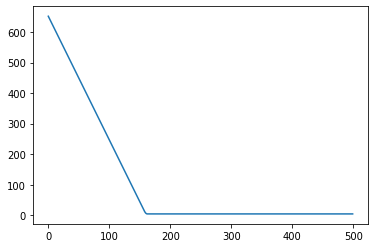

In [93]:
import random
import matplotlib.pyplot as plt
learning_rate = 0.1
learn_times = 500
loss_min = float('inf')
k_random = random.random()*200-100
b_random = random.random()*200-100
losses = []
for i in range(learn_times):
    y_hatt = price(k_random,x,b_random)
    loss_new = loss(y,y_hatt)
    losses.append(loss_new)
    if loss_new < loss_min:
        loss_min = loss_new
    k_random += -1*partial_k(x,y,y_hatt)*learning_rate
    b_random += -1*partial_b(y,y_hatt)*learning_rate
    print('times =={}'.format(i))
    print('k is {},b is {},loss is {}'.format(k_random,b_random,loss_new))
plt.plot(range(len(losses)),losses)
plt.show()
         
        

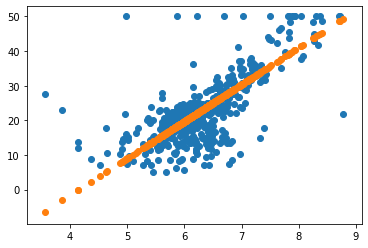

In [94]:
plt.scatter(x,y)
plt.scatter(x,price(k_random,x,b_random))
#plt.scatter(x,price(2.552576639566758,x,5.862944747335252))

### Part 3: Finish the Solution Parse Part of Edit-Distance

In [132]:
str='abc'
print(str[-1])
print(len(str))

c
3


In [149]:
solution_1 = {}
def distanc(str1,str2):
    if str1=='':
        return len(str2)
    elif str2=='':
        return len(str1)

    if (str1[-1]==str2[-1]):
        m = (distanc(str1[:-1],str2[:-1]),'')
    else:
        m = (distanc(str1[:-1],str2[:-1])+1,'exch {} to {}'.format(str1[-1],str2[-1]))
    solu = [(distanc(str1[:-1],str2)+1,'del {}'.format(str1[-1])),
            (distanc(str1,str2[:-1])+1,'add {}'.format(str2[-1])),
            m]
    distance,solution = min(solu,key = lambda x:x[0])
    solution_1[(str1,str2)] = solution
    return  distance
        #return min(distanc(str1[:-1],str2)+1,distanc(str1,str2[:-1])+1,m)

print(distanc('b','abc'))
print(solution_1[('b','abc')])

    

2
add c


### Part 4 Choose 1 - 2 books to keep reading: 

+ SICP, Structure and Interpretation of Computer Programming. 
+ Introduction to Algorithms 
+ Artificial Intelligence A Modern Approach (3rd Edition) 
+ Code Complete 2 
+ Programming Pearls 
+ Deep Learning
+ 黑客与画家
+ 数学之美
+ Fluent Python
+ Hands on Tensorflow
+ Conference: NIPS_ ICML_ ICLR_ ACL_ AAAI

> most books you may find in our github: https://github.com/Computing-Intelligence/References

## Part 5-1: review machine learning

1. Why do we use Derivative / Gredient to fit a target function?¶

Ans:沿着梯度的负方法移动，求解，通过不断迭代，获得局部最优解。

2. In the words 'Gredient Descent', what's the Gredient and what's the Descent?¶

Ans:梯度就是某个点的最大方向导数，下降就是导数的负方向。


3. What's the advantages of the 3rd gradient descent method compared to the previous methods?

Ans:越接近最小值时，会自动更新调整的幅度；特征值多时，耗时相对较短。

4. Using the simple words to describe: What's the machine leanring.¶

In [ ]:
是人工智能的一个领域，设计让计算机自动学习的方法。

### Part 5: Answer following questions: 

1. Why do we need dynamic programming? What's the difference of dynamic programming and previous talked `search` problme? 

Ans:将一个问题拆分成子问题，分别求解出子问题，能得到全局最优解。动态规划是思考怎么由上一个状态来获得当前状态，搜索问题是思考下一步该怎么走。

2. Why do we still need dynamic programming? Why not we train a machine learning to fit a function which could get the `right` answer based on inputs?

Ans:动态规划算法时间复杂度低，能得到全局最优解，机器学习通过迭代获得的是相对准确的预估值。

3. Can you catch up at least 3 problems which could solved by Dynamic Programming? 

Ans:最短编辑距离；割管子问题；kmp算法

4. Can you catch up at least 3 problems wich could sloved by Edit Distance? 

Ans: 数据对齐；拼写纠错；字符串相似度。

5. Please summarize the three main features of Dynamic Programming, and make a concise explain for each feature. 

Ans:无后效性，最优子结构（一个问题的最优解可以由子结构的最优解获取），重叠的子问题集（可以拆分为重叠的子问题，用递归解决）。

6. What's the disadvantages of Dynamic Programming? (You may need search by yourself in Internet)

Ans:消耗空间大，当所给出范围很大时，堆栈中很可能并不能满足所需要的空间大小，往往对其的解决办法是降低数组维度，或者去除一些不必要的状态数等。

## Part 6 Preparation of Project-01

1. Using python Flask or Bottle to finish your first simple web app:
> https://bottlepy.org/

2. Learn what's the SQL, and try some simple SQL operations:
> https://www.w3schools.com/sql/sql_intro.asp

3. Learn what's the HTML ( *ONLY* need to know the basic things)
> https://getbootstrap.com/; https://www.w3schools.com/html/

### (Optinal) Finish the k-person-salesman problem:

In [7]:
import random
import matplotlib.pylab as plt

In [8]:
latitudes = [random.randint(-100, 100) for _ in range(20)]
longitude = [random.randint(-100, 100) for _ in range(20)]

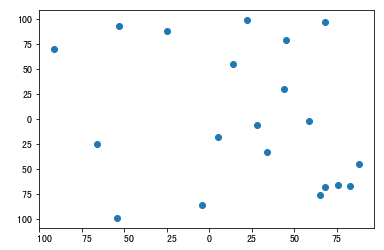

In [9]:
plt.scatter(latitudes, longitude)

给定一个初始点 𝑃, 已经 𝑘个车辆，如何从该点出发，经这 k 个车辆经过所以的点全部一次，而且所走过的路程最短?

例如：

In [14]:
chosen_p = (-50, 10)
chosen_p2 = (1, 30)
chosen_p3 = (99, 15)

In [4]:
import matplotlib.pyplot as plt

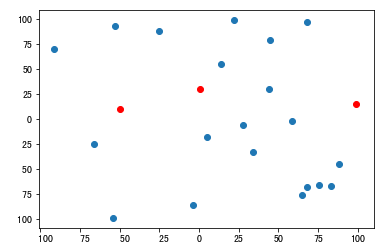

In [15]:
plt.scatter(latitudes, longitude)
plt.scatter([chosen_p[0]], [chosen_p[1]], color='r')
plt.scatter([chosen_p2[0]], [chosen_p2[1]], color='r')
plt.scatter([chosen_p3[0]], [chosen_p3[1]], color='r')

shuro